# ADA Project by Sten Elling and Christian Luebbe

**Disclaimer** The analysis below was carried by Sten Elling and Christian Luebbe as the project components of the Applied Data Analysis course at the EPFL in 2017. The overall results were submitted through this notebook and a 4-page report. In addition, the project was presented at a poster session. 


# Table of contents
1. [Gathering and preparing the data](#Data_prep)
    1. [The data sets](#Data_sets)
    2. [Preparing the data sets](#Prep_data)
    3. [Translations German to English](#Translation)
    4. [Saving/Loading data frames](#save_frames)
    5. [Defining functions](#Functions)
2. [The people living in ZH - overall and by feature](#ZH_total_numbers)
    1. [Total population](#Total_popul)
    2. [Number of moves to/within/out of Zurich](#move_numbers)
    3. [District population](#d_popul)
    4. [The gender gap](#gender_gap)
    5. [Age distributions](#Age)
    6. [Single or Married](#single_married)
    7. [Swiss and foreigners](#foreigners)
    8. [The case: Escher Wyss](#EW)
3. [The storyline - Life in zurich](#Storyline)
    1. [Defining functions](#SL functions)
    2. [A single storyline](#1SL)
    3. [1000 storylines](#1000SL)
4. [Analysis of moves between districts](#D2D)

In [1]:
# Import libraries
import glob
import pandas as pd
import numpy as np
import calendar
from datetime import datetime
pd.options.mode.chained_assignment = None 
import requests
from difflib import SequenceMatcher
%matplotlib inline
pd.set_option('display.max_colwidth', -1)
import scipy
from scipy.ndimage import imread
import os
import json
import seaborn
import math
import matplotlib.pyplot as plt

### Maps and widgets
import folium
from folium import plugins
import branca.colormap as cms
from branca.colormap import linear
from IPython.display import display, Image, HTML, IFrame
from __future__ import print_function
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual, IntSlider





Link to nbviewer: http://nbviewer.jupyter.org/github/StenElling/ADA/blob/master/Project%20ADA/Milestone3/Project%20-%20Milestone%203%20final.ipynb

## Gathering and preparing the data <a name="Data_prep"></a>

The data we use is listed on Swiss open data. The actual data and further desciptions are given on Open Data Zurich. For the project we consider 

### The data sets: <a name="Data_sets"></a>

1) "Umzüge nach Stadtquartier, Geschlecht, Altersgruppe und Zivilstand, seit 1993" lists all moves between districts of the City of Zurich since 1993 by district, gender, age group and marital/civil status

2) "Zuzüge nach Zuzugsort, Stadtquartier, Geschlecht, Altersgruppe und Zivilstand, seit 1993" lists all moves into districts of the City of Zurich from outside since 1993 by place of origin, district, gender, age group and marital/civil status

3) "Wegzüge nach Wegzugsort, Stadtquartier, Geschlecht, Altersgruppe und Zivilstand, seit 1993" lists all moves out of districts of the City of Zurich from outside since 1993 by place of origin, district, gender, age group and marital/civil status

4) "Bevölkerung nach Stadtquartier, Herkunft, Geschlecht und Alter, seit 1993" lists all people living in districts by age, Swiss/foreigh and gender

5) "Bevölkerung nach Nationalität und Stadtquartier, seit 1993" lists number of people and nationalities in each district

6) "Bevölkerung und Anzahl Nationalitäten nach Stadtquartier, seit 1993" lists number of people and nationalities in each district

**Comment:** We initially considered integrating information on median wealth and median income for each district. However, we gained a lot of interesting insight analysing data from the other data sets. So these data sets may be used in extended versions of this project.

7) "Median-Vermögen steuerpflichtiger natürlicher Personen nach Jahr, Steuertarif und Stadtquartier" lists the quartile of taxable wealth per tax class for each district

8) "Median-Einkommen steuerpflichtiger natürlicher Personen nach Jahr, Steuertarif und Stadtquartier" lists the quartile of income per tax class for each district

### Downloading the data sets

In [2]:
ZH_within_1993_URL = 'https://data.stadt-zuerich.ch/dataset/bev_umzuege_jahr_quartier_ag_zivilstand/resource/212bc17b-25ac-4c1c-bef0-cedfddaaceb7/download/bev355od3556.csv'

ZH_in_1993_URL = 'https://data.stadt-zuerich.ch/dataset/bev_zuz_jahr_quartier_ag_zivilstand/resource/aa5020b5-4e21-4c06-897c-478e08277419/download/bev351od3512.csv'

ZH_out_1993_URL = 'https://data.stadt-zuerich.ch/dataset/bev_wegz_jahr_quartier_ag_zivilstand/resource/7462b6b8-100a-4782-a12b-6649a9f1c249/download/bev352od3522.csv'

ZH_population_1993_URL = 'https://data.stadt-zuerich.ch/dataset/6f8b5279-998b-4000-a5a4-e3addf10c49e/resource/f2384262-e8c8-4d04-91fa-3cbf15e2b673/download/bev390od3903.csv'

ZH_nationalities_1993_URL = 'https://data.stadt-zuerich.ch/dataset/bev_bestand_jahr_quartier_nationalitaet/resource/10b83df1-b247-467d-a3cb-0b389a758e1a/download/bev336od3361.csv'

ZH_number_nation_1993_URL = 'https://data.stadt-zuerich.ch/dataset/bev_bestand_jahr_anz_nationen_quartier/resource/634b6e5a-7143-4eab-9f5d-fb75dd92d5da/download/bev336od3363.csv'

# Not used in this project
#ZH_median_wealth_1999_URL = 'https://data.stadt-zuerich.ch/dataset/f8c9ebd3-629b-450b-9a61-244bcf7ec44b/resource/e4d02782-e6f8-4138-9b41-ac8946ee3327/download/wir100od1004.csv'

#ZH_median_income_1999_URL = 'https://data.stadt-zuerich.ch/dataset/63e0caf8-a46c-4aec-ad13-d1803d448f9c/resource/0c67045f-ce8d-4dff-b1e3-2263524f96f4/download/wir100od1007.csv'

#Defining the data frames
ZH_within_df=pd.read_csv(ZH_within_1993_URL)
ZH_in_df=pd.read_csv(ZH_in_1993_URL)
ZH_out_df=pd.read_csv(ZH_out_1993_URL)
ZH_population_df=pd.read_csv(ZH_population_1993_URL)
ZH_nationalities_df=pd.read_csv(ZH_nationalities_1993_URL)
ZH_number_nation_df=pd.read_csv(ZH_number_nation_1993_URL)
# Not used in this project
#ZH_median_wealth_df=pd.read_csv(ZH_median_wealth_1999_URL)
#ZH_median_income_df=pd.read_csv(ZH_median_income_1999_URL)

### Preparing the data <a name="Prep_data"></a>

#### Translating column names for individual frames

In [3]:
# Stadtquartier translated as district
# Kreis translated as council
#Bezirk translated as county

ZH_within_df.columns = ['Year', 
                       'district_from_code', 'district_from_name', 'council_from_code',
                       'district_to_code', 'district_to_name', 'council_to_code',
                       'age_group_code', 'age_group', 'gender', 
                       'marital_code', 'marital_status', 'Total']

ZH_in_df.columns = ['Year', 
                    'county_from_code', 'county_from_name', #foreigner for non-Swiss origin
                    'canton_from_code', 'canton_from_name', #foreigner for non-Swiss origin
                    'country_from_code', 'country_from_name', 
                    'subcontinent_from_code', 'subcontinent_from_name', 
                    'continent_from_code', 'continent_from_name',
                    'district_to_code', 'district_to_name', 'council_to_code',
                    'age_group_code', 'age_group', 'gender', 
                    'marital_code', 'marital_status', 'Total']

ZH_out_df.columns = ['Year', 
                    'county_to_code', 'county_to_name', #foreigner for non-Swiss
                    'canton_to_code', 'canton_to_name', #foreigner for non-Swiss
                    'country_to_code', 'country_to_name', 
                    'subcontinent_to_code', 'subcontinent_to_name', 
                    'continent_to_code', 'continent_to_name',
                    'district_from_code', 'district_from_name', 'council_from_code',
                    'age_group_code', 'age_group', 'gender', 
                    'marital_code', 'marital_status', 'Total']

ZH_population_df.columns = ['Year', 'district_code', 'district_code2', 'district_name',
                            "age", "age2", "age_group5_code", "age_group5",
                            "CH_nonCH", "CH_nonCH_code", "gender_code", "gender", "Total"]
ZH_population_df = ZH_population_df.drop(['district_code2', 'age2',
                                          'gender_code', 'CH_nonCH_code'], axis=1)

# Difference between nation_hist and nation exist in case where nations split or united
# e.g. "Serbien, Montenegro, Kosovo" vs "Serbien" (2006), "Montenegro"(2006/07), "Kosovo"(2008)
ZH_nationalities_df.columns = ['Year', 'district_code', 'district_code2', 'district_name', 
                               'nation_hist_code', 'nation_hist_name', 'nation_code', 'nation_name', 
                               'subcontinent_code', 'subcontinent_name', 
                               'continent_code', 'continent_name', 'Total']

ZH_number_nation_df.columns = ['Year', 'district_code', 'district_code2', 'district_name', 
                               'Total_pop', 'Total_nat']

# Not used in this project
#ZH_median_wealth_df.columns = ['Year', 'district_code', 'district_name', 
#                               'tax_code', 'tax_class', 
#                               'tax_wealth_p50', 'tax_wealth_p25', 'tax_wealth_p75']
## Kreis translated as borough, borough = set of districts
#ZH_median_wealth_df.columns = ['Year', 'borough_code', 'borough_name', 
#                               'tax_code', 'tax_class', 
#                               'tax_wealth_p50', 'tax_wealth_p25', 'tax_wealth_p75']


# Grouping all data frames
all_frames = [ZH_in_df, ZH_within_df, ZH_out_df, ZH_population_df,
              ZH_nationalities_df, ZH_number_nation_df#, ZH_median_wealth_df, ZH_median_income_df
             ]

### Replacing the most frequently used German terminology with English terms <a name="Translation"></a>

We create dictionaries for the most common terms that appear in the data. This will allow English speaking readers and group members to work with the data.

Comment: At this stage we don't translate all the country names, as we expect that country names are rarely called.We may do their translation using a dictionary at a later stage.

In [4]:
# We create a dictionary of distionaries to translate individual categories

translation = {"marital_status" : {"Ledig" : "Single", "Verheiratet" : "Married", 
                                    "Geschieden" : "Divorced", "Verwitwet" : "Widow", 
                                    "In eingetragener Partnerschaft" : "Registered partnership", 
                                    "Aufgelöste Partnerschaft" : "Disolved partnership", 
                                    "Unbekannt" : "Unknown"},
               "tax_class" :       {"Grundtarif" : "base rate",
                                    "Verheiratetentarif" : "couple rate",
                                    
                                    "Einelternfamilientarif" : "single parent family rate"},
               "gender" :          {"W":"F"}}
translation_global = {"Ausland" : "Foreign", "Ausländer/in" : "Foreign",
                      "Schweizer/in" : "Swiss", "Unbekannt" : "Unknown",
                      "Unzuteilbar" : "Undetermined", "100 u. älter" : "99+"}

for frame in all_frames:
    frame.replace(translation, inplace=True)
    frame.replace(translation_global, inplace=True)


### Saving the data frames locally <a name="save_frames"></a>

We save the data with all our changes to files in a local drive.

In [5]:
ZH_in_df.to_csv('Data/ZH_in.csv', encoding='utf-8', index = False)

ZH_out_df.to_csv('Data/ZH_out.csv', encoding='utf-8', index = False)

ZH_within_df.to_csv('Data/ZH_within.csv', encoding='utf-8', index = False)

ZH_population_df.to_csv('Data/ZH_popul.csv', encoding='utf-8', index = False)

ZH_nationalities_df.to_csv('Data/ZH_nationalities.csv', encoding='utf-8', index = False)

ZH_number_nation_df.to_csv('Data/ZH_number_nation.csv', encoding='utf-8', index = False)

# Not used in this project
#ZH_median_wealth_df.to_csv('Data/ZH_median_wealth.csv', encoding='utf-8', index = False)

#ZH_median_income_df.to_csv('Data/ZH_median_income.csv', encoding='utf-8', index = False)



 ### Retrieving our data from the local drive

In [6]:
ZH_in_df = pd.read_csv('Data/ZH_in.csv')
ZH_within_df = pd.read_csv('Data/ZH_within.csv')
ZH_out_df = pd.read_csv('Data/ZH_out.csv')
ZH_popul = pd.read_csv('Data/ZH_popul.csv')
ZH_nationalities_df = pd.read_csv('Data/ZH_nationalities.csv')
ZH_nations_df = pd.read_csv('Data/ZH_number_nation.csv')

all_frames = [ZH_in_df, ZH_within_df, ZH_out_df, ZH_popul, ZH_nationalities_df, ZH_nations_df]

### Defining functions used to create subframes and plots <a name="Functions"></a>

In [7]:
# The function: df_subset_total
# df = data frame to be used
# retain_columns = list of columns that we retain, while all other columns are collapsed
# total_column = the name of the column with the values we wish to add up, e.g. 'Total' or 'count'
#
# Observe: the final data frame contains the columns in retain_columns and total_column
#
# Definition:
def df_subset_total(df, retain_columns, total_column):
    output = pd.DataFrame({'Total' : df.groupby( retain_columns )[total_column].agg('sum')}).reset_index()
    return output;


#-------------------------------------------------------------------------------------------------------------

# The function: df_subset_percent
# df = data frame to be used
# selected_columns = list of selected columns for which we find maximum value for each possible combination, 
#                    remaining columns are displayed to identify criteria.
#                    Note: Apply df_subset_total first if we want to sum over certain columns first
# total_column = the name of the column with the values we wish to select maximum from, e.g. 'Total' or 'Value'
#

def df_subset_percent(df, retain_groups, percent_group, total_column):
    # create groupby_list by checking form retain_groups has
    if isinstance(retain_groups, str)==True:
        groupby_list = [retain_groups, percent_group]
    else:
        groupby_list = retain_groups + [percent_group]

    # Initial grouping (basically a sorted version of df)
    InitGroupby_df = df.groupby(groupby_list).agg({total_column: 'sum'}).reset_index()
    # Get the sum of values (Total) for the "final group", append "_Sum" to it's column name to get "Total_Sum",
    # and change it into a dataframe (.reset_index)
    SumGroup_df = df.groupby(retain_groups).agg({total_column: 'sum'}).add_suffix('_Sum').reset_index()
    # Merge the two dataframes
    Percents_df = pd.merge(InitGroupby_df, SumGroup_df)
    # Divide the two columns
    Percents_df["Percent of"+" "+percent_group] = Percents_df[total_column] / Percents_df[total_column+"_Sum"] * 100
    # Drop the extra Total_Sum column
    Percents_df.drop([total_column+"_Sum"], inplace=True, axis=1)
    output = Percents_df
    return output;


#-------------------------------------------------------------------------------------------------------------

# The function: df_subset_max
# df = data frame to be used
# selected_columns = list of selected columns for which we find maximum value for each possible combination, 
#                    remaining columns are displayed to identify criteria.
#                    Note: Apply df_subset_total first if we want to sum over certain columns first
# total_column = the name of the column with the values we wish to select maximum from, e.g. 'Total' or 'Value'
#
# Observe: The final result has exactly one row with each possible value combinations from selected_columns
#          In order to select the maximum from certain criteria we may wish to collapse some columns first 
#          with df_subset_total before finding the max
#
# Definition:

def df_subset_max(df, selected_columns, total_column):
    output = df[ df[total_column] == df.groupby( selected_columns)[total_column].transform(max) ]
    return output;


#-------------------------------------------------------------------------------------------------------------

# The function: df_select_values
# df = data frame to be used
# selected_column = name of column for which we want to select values
# value_list = list of values we want to view e.g. ['val1', val2', val3']
#
# Definition:

def df_select_values(df, selected_column, value_list):
    output = df[df[selected_column].isin(value_list)]
    return output;


In [8]:
# Turn into a function
# df = dataframe to be used
# feature = name of feature for which subgropus are explored
# title_start = string for title of graphs
# 
def plot_by_feature_annual(df, feature, total_column, title_start, add_small_plot=False, ymax_total=5000, ymax_percent=10):
    df1 = df_subset_total(df, ['Year', feature], total_column)
    table1 = df1.pivot(values=total_column, index='Year',columns=feature)
    df2 = df_subset_percent(df1, 'Year', feature, total_column)
    #values_choice='Percent of ' + feature
    table2 = df2.pivot(values='Percent of ' + feature, index='Year',columns=feature)
    
    fig, axes = plt.subplots(1, 2, figsize=(18,6))
    table1.plot.line(ax=axes[0], title=title_start + ' - Total by ' + feature, stacked=False, grid=True )
    table2.plot.line(ax=axes[1], title=title_start + ' - Portion by ' + feature, grid=True )
    
    if add_small_plot==True:
        fig, axes = plt.subplots(1, 2, figsize=(18,6))
        table1.plot.line(ax=axes[0], title=title_start + ' - Total by ' + feature + ' - small group sizes', 
                         grid=True, ylim=(0,ymax_total) )
        table2.plot.line(ax=axes[1], title=title_start + ' - Total by ' + feature + ' - small group sizes', 
                         grid=True , ylim=(0,ymax_percent) )
    print('  ');

# Total number of people in Zurich --- overall and by feature <a name="ZH_total_numbers"></a>

We calculate the total number of people in ZH and create data frames for the annual total populations and for the features gender and Swiss/Foreigner. For the categorical variables (gender, marital_status, age_group, Swiss/Foreigner) we work with percentages.

We visualise data for different features across districts by using maps. For some maps we also implement widgets which allows the user to change certain parameters, like the year. In order to use the widgets the notebook most be opened in Jupyter.

## The total population of the City of Zurich <a name="Total_popul"></a>

In [9]:
ZH_popul_annual = df_subset_total(ZH_popul, 'Year', 'Total')#.set_index('Year')
# ZH_popul_annual.head()

# Defining some new subframes and saving them for quick access
district_popul = df_subset_total(ZH_popul, ['Year', 'district_name'], 'Total')
district_popul.set_index('Year').to_csv('Data/district_popul.csv', encoding='utf-8', index = True)
district_popul.reset_index()
district_popul_gender = df_subset_total(ZH_popul, ['Year', 'district_name', 'gender'], 'Total')
district_popul_gender.set_index('Year').to_csv('Data/district_popul_gender.csv', encoding='utf-8', index = True)
district_popul_CH = df_subset_total(ZH_popul, ['Year', 'district_name', 'CH_nonCH'], 'Total')
district_popul_CH.set_index('Year').to_csv('Data/district_popul_CH.csv', encoding='utf-8', index = True)

In [10]:
# Reading data frames from local copies
# ??? ZH_popul = pd.read_csv('Data/district_popul.csv') ??? - Commented out as unclear what it referred to
district_popul = pd.read_csv('Data/district_popul.csv')
district_popul_gender = pd.read_csv('Data/district_popul_gender.csv')
district_popul_CH = pd.read_csv('Data/district_popul_CH.csv')

### Plot of the population of the City of Zurich over time

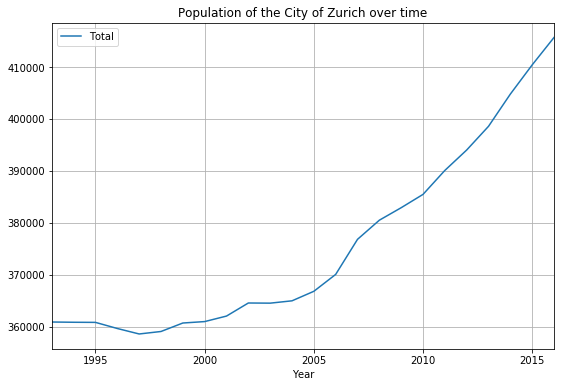

In [11]:
ZH_popul_annual.plot.line(x='Year', grid=True, figsize=(9,6), title='Population of the City of Zurich over time')

We can see that the population has grown, first at a rate of 1250 per year from 1998-2006 and then at a steady rate of around 4500 per year since 2006. That is equivalent to around 1.25% per year.

### Analysing changes in the number of moves over time <a name="move_numbers"></a>

In [12]:
ZH_in_annual = df_subset_total(ZH_in_df, 'Year', 'Total').set_index('Year')
ZH_in_annual.columns = ['Total_in']
ZH_within_annual = df_subset_total(ZH_within_df, 'Year', 'Total').set_index('Year')
ZH_within_annual.columns = ['Total_within']
ZH_out_annual = df_subset_total(ZH_out_df, 'Year', 'Total').set_index('Year')
ZH_out_annual.columns = ['Total_out']
ZH_moves_totals = pd.concat([ZH_in_annual, ZH_within_annual, ZH_out_annual], axis=1 )


ZH_popul_annual=ZH_popul_annual.set_index('Year')
# Representing moves against population per 100
ZH_moves_per_100 = ZH_moves_totals[['Total_in', 'Total_within', 'Total_out']].div(ZH_popul_annual['Total'], axis=0)*100


#### Annual total number of moves and per 100 people of the population

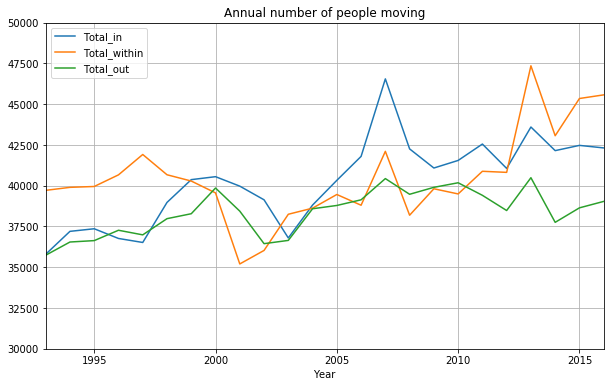

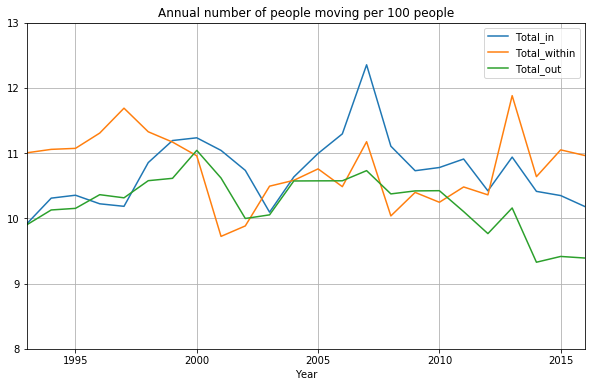

In [13]:
# Plot totals for 3 data sets
ZH_moves_totals.plot.line(title='Annual number of people moving', grid=True, ylim = (30000,50000),figsize=(10,6) )

# Plot percentage for 3 data sets
ZH_moves_per_100.plot.line(title='Annual number of people moving per 100 people', grid=True, ylim = (8,13),figsize=(10,6) )

**Observations:** 

1) All three movements are roughly of equal scale. In particular, there are as many people moving between districts as either move in from outside or move out to elsewhere.

2) The long term trend for the total number in all three groups is up. However when we adjust against the current population we see that per 100 ZH_in and ZH_out slightly decrease in the last decade (even ignoring 2007 spike). In contrast the number of people living in Zurich who move within the city moving has gone up in the last 5 years.

The long term views for any of the movements show no clear change compared to the annual fluctuations. ZH_within has just recovered the dip from 11% to 10% has just been recovered.

3) According to these figures, from 2005 onwards we have an on-going net gain (ZH_in - ZH_out) of 2000-5000 people per year from 2005 onwards. In the interval [2006-2016] the overall population increase on average by 4000 people. However, our current analysis ignores births and deaths for Zurich. Secondary information indicates that the number of births been rising in the last decade, and hence this could account for the difference.

4) If we have a year-to-year change of more than 2500, say, then we consider this a sharp drop or sharp rise. If a sharp rise is followed by a sharp drop, and the corrected net change would not be classified as sharp, then we consider it a spike or dip.

Following these notions we observe: 

ZH_in: We have a dip in 2003 and spike in 2007. 2013 appears to be due to general fluctuations.

ZH_within: We have a sharp drop in for 2001 (wider dip 2001 and 2002) and spikes in 2007 and 2013. 

ZH_out: We have a wider dip in 2002 and 2003. 2013 appears to be due to general fluctuations.


**Questions and tasks:** 

Do the dips around 2002 and the spikes in 2007 and 2013 result from certain subsets of the population? That is to say: Are there subsets for which these charcateristics appear and others for which they are not noticable? 

Was the change for ZH_in caused by Swiss people or by an increase for a specific group of foreigners?

Are these general changes reflected across all districts, too? Or do they vary by districts?

**Task:** 

Data should show which districts grew in number and in relative terms (expect inner city to have few extra buildings). Allow us to compare movement figures against base population.

### An observation

The shape of the graph for people moving to Zurich broadly matches the shape of the Swiss Performance index (SPI) between 1995 and 2015. 

The first long-term decline in the SPI (2000-2003) relates to the burst of the dot.com bubble and the evenst following the 9/11 attacks in the US.

The second long-term decline in SPI (2007-2009) relates to the financial crisis.

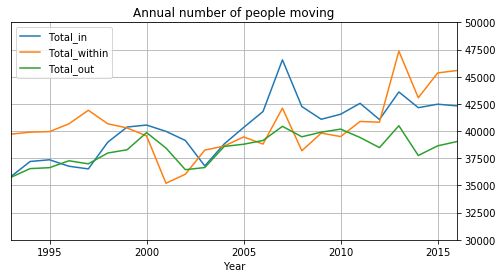

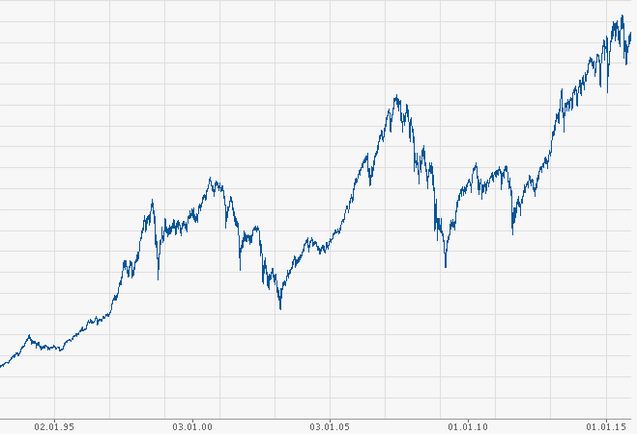

In [14]:
# Re-plot totals for 3 data sets
ZH_moves_totals.plot.line(title='Annual number of people moving', grid=True, ylim = (30000,50000),figsize=(8,4) ).yaxis.tick_right()
plt.show()
Image(filename="Images/Swiss_performance_index_clip.png", width= 450, height= 100)

# Image(filename="Images/Swiss_performance_index_zoom.png", width= 500, height=300)

Overall we observe that all 3 curves broadly follow the movements of the state of the economy, as tracked by the SPI. The overall picture suggests that in times of uncertainty people stay where they are, while in times of prosperity the rates of moves increase.

For the years 2010-2015 the number of people moving into and out of Zurich has remained fairly steady while the SPI has increased again (the state of the  economy improved). As observed earlier the overall population of Zurich also increased in this time interval, but the netgain (ZH_in - ZH_out) could not fully account for the increase of population in Zurich. Instead of attracting more people, prosperity might have lead to higher birth rates.

## Total population of each districts <a name="d_popul"></a>

We define the Kreise according to the districts (https://de.wikipedia.org/wiki/Stadtteile_der_Stadt_Zürich).

We group 3 Kreise into bigger sets of 7-9 districts, and we will later generate seperate subplots for each of these groups.

In [15]:
Kreis1 = ['Rathaus', 'Hochschulen', 'Lindenhof', 'City']
Kreis2 = ['Wollishofen', 'Leimbach', 'Enge']
Kreis3 = ['Alt-Wiedikon', 'Friesenberg', 'Sihlfeld']
Set1= Kreis1 + Kreis2 + Kreis3 

Kreis4 = ['Werd', 'Langstrasse', 'Hard']
Kreis5 = ['Gewerbeschule', 'Escher Wyss']
Kreis6 = ['Unterstrass', 'Oberstrass']
Set2= Kreis4 + Kreis5 + Kreis6 

Kreis7 = ['Fluntern', 'Hottingen', 'Hirslanden', 'Witikon']
Kreis8 = ['Seefeld', 'Mühlebach', 'Weinegg']
Kreis9 = ['Albisrieden', 'Altstetten']
Set3= Kreis7 + Kreis8 + Kreis9 

Kreis10 = ['Höngg', 'Wipkingen']
Kreis11 = ['Affoltern', 'Oerlikon', 'Seebach']
Kreis12 = ['Saatlen', 'Schwamendingen-Mitte', 'Hirzenbach']
Set4= Kreis10 + Kreis11 + Kreis12 

In [16]:
def plot_feature_by_district(df, group_name, column_to_plot):
    # Plotting percentage or total of a feature per district over time
    # Note df must have already isolated a feature for a particular value 
    # and calculated the percentages or total
    df_Set1 = df_select_values(df, 'district_name', Set1)
    df_Set2 = df_select_values(df, 'district_name', Set2)
    df_Set3 = df_select_values(df, 'district_name', Set3)
    df_Set4 = df_select_values(df, 'district_name', Set4)

    #Plot the 4 sets
    fig, axes = plt.subplots(2, 2, figsize=(18,18))

    df_Set1.pivot(values=column_to_plot, index='Year',columns='district_name').plot.line(
        ax=axes[0,0], title=group_name+' in Kreise 1, 2 ,3', stacked=False, grid=True)

    df_Set2.pivot(values=column_to_plot, index='Year',columns='district_name').plot.line(
        ax=axes[0,1],title=group_name+' in Kreise 4, 5, 6', stacked=False, grid=True)

    df_Set3.pivot(values=column_to_plot, index='Year',columns='district_name').plot.line(
        ax=axes[1,0], title=group_name+' in Kreise 7, 8, 9', stacked=False, grid=True)

    df_Set4.pivot(values=column_to_plot, index='Year',columns='district_name').plot.line(
        ax=axes[1,1], title=group_name+' in Kreise 10, 11, 12', stacked=False, grid=True);


### A Mapping illustrating the size of the districts

Each district is categorised into one of three different sizes. Large if the population is larger then 20 000, medium if the population size is between 10 000 and 20 000 and small if the population is smaller then 10 000. 

We look at the sizes of the districts in 2016 and plot their size (small, medium, large) on a map.

In [17]:
ZH_popul_2016 = ZH_popul[ZH_popul['Year']==2016]
#ZH_popul_2016_dist = ZH_popul_2016[]
district_size_2016 = df_subset_total(ZH_popul_2016, ['Year', 'district_name'],'Total') 

district_size_2016

,Year,district_name,Total
0,2016,Affoltern,26054
1,2016,Albisrieden,21174
2,2016,Alt-Wiedikon,17321
3,2016,Altstetten,31724
4,2016,City,810
5,2016,Enge,9422
6,2016,Escher Wyss,5825
7,2016,Fluntern,8038
8,2016,Friesenberg,11002
9,2016,Gewerbeschule,9598


In [18]:
size = []
for district1 in district_size_2016.district_name :
    dataframe = district_size_2016[district_size_2016['district_name']==district1]
    if dataframe.Total.iloc[0] > 20000 :
        size.append('Large')
    elif dataframe.Total.iloc[0]>10000 :
        size.append('Medium')
    else :
        size.append('Small')
# Append the size to the dataframe
district_size_2016['Size'] = size
district_size_2016.Size.value_counts()

Small     15
Medium    11
Large     8 
Name: Size, dtype: int64

### The map for 2016

There are 15 small district (red), 11 medium size district (green) and 8 large district (blue). 

In [19]:
# Define a function for the color of different district size.
def district_size_2016_color(district):
    dist_size = district_size_2016.loc[district_size_2016['district_name'] == district, 'Size'].values[0]
    if dist_size == 'Large':
        return '#0000ff' # blue
    elif dist_size == 'Medium':
        return '#00ff33' # green
    else :
        return '#ff0000' # red

In [20]:
#Plot the map
zurich_geo_path = r'Data/ZH_district_geo.json'
geo_json_data = json.load(open(zurich_geo_path))
zh_map = folium.Map(location=[47.3769, 8.5417], zoom_start=12,tiles='cartodbpositron')
folium.GeoJson(
    geo_json_data,
    style_function=lambda feature: {
        'fillColor': district_size_2016_color(feature['properties']['qname']),
        'color' : 'black',
        'weight' : 2,
        'dashArray' : '5, 5'
        }
    ).add_to(zh_map)

zh_map

#### Observations
The largest districts (> 20000) of Zurich are located in the North of Zurich. The districts in the city center and near teh lake are the smallest (< 10000). Medium sized districts (10000-20000) are sandwiched in between or they are located in the South-West or the East of the city.

### Population size of the districts

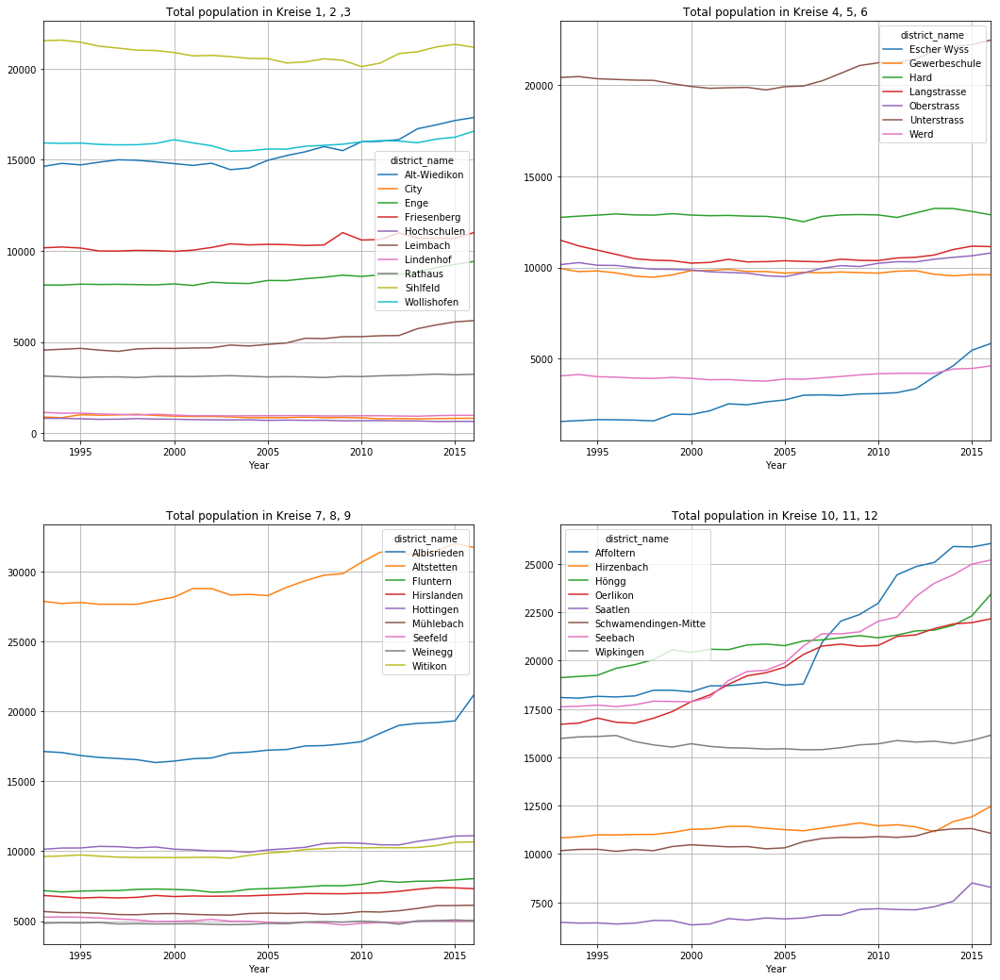

In [21]:
plot_feature_by_district(district_popul, 'Total population', 'Total')

** Observation ** 

Overall we can spot different trends (with examples):

a) some stagnated: Rathaus, City, Hochschulen

b) some grew steadily at similar rates: Altstetten, Oerlikon (with different rates for 1997-2007 and 2007-2017), Hoengg

c) others were stagnating and then started to increase at a specific point in time: Affoltern from 2007, Seebach from 2000, Escher Wyss from 1998 and then even more from 2012.

d) and some decline slightly before recovering: Langstrasse, Wipkingen

Of course there may be various reasons for these trends. Down town has limited capacity of living space and little chance to expand. Outer districts may gradually build up open (green) space or convert industrial areas (brown space) into residential areas. Affoltern seems to be an example where there was a sudden increase in people moving there. Given the prior stagnation this suggest a sudden availability of living space through new buildings.

However we can observe that Hard, Langstrasse, Werd and Gewerbeschule all stagnate and all lie in Kreis 4 und 5.

Similarly Saatlen, Schwamendingen-Mitte, Hirzenbach stagnate and all lie in Kries 12.

In the final two panels Altstetten, (Albisrieden,) Affoltern, Hoengg, Oerlikon and Seebach all show growths. These districts all lie along the North-West periphery in Kreis 9, 10, 11.

The centre and the South (Kreis 2, 3, 8) are mostly static.

So there are some clear indicators of geolocation relting to growht here. (and this was to be expected)

** Questions **

How did the age and gender distribution change (or not) with time in districts following different trends?

Did the distribution of people moving to Affoltern in the years after 2007 show a characteristic profile?

### The turnover rate of 20-29 year olds in some district

Below we briefly look at the number of 20-29 year olds who leave a district (to outside of ZH or to another district) with the number of of 20-29 year olds who live in the district. 

In [22]:
df_20 = df_select_values(ZH_popul, 'age_group5', ['20-24', '25-29'])
df_dy20 = df_subset_total(df_20, ['Year', 'district_name'], 'Total')
# Total population of 20-29 year olds by year and district
df_dy20.set_index(['Year', 'district_name'], inplace=True)

# Moving data for 20-29 by district and year
# Age selection
move_in20 = ZH_in_df[ZH_in_df.age_group=='20-29']
move_within20 = ZH_within_df[ZH_within_df.age_group=='20-29']
move_out20 = ZH_out_df[ZH_out_df.age_group=='20-29']
# Subset to year and district(from/to) and create arrivals and leavers of age 20-29
move_in_dy20 = df_subset_total(move_in20, ['Year', 'district_to_name'], 'Total')
move_in_dy20.rename(columns={'district_to_name' : 'district_name'}, inplace=True)
move_in_dy20.set_index(['Year', 'district_name'], inplace=True)
move_within_2dy20 = df_subset_total(move_within20, ['Year', 'district_to_name'], 'Total')
move_within_2dy20.rename(columns={'district_to_name' : 'district_name'}, inplace=True)
move_within_2dy20.set_index(['Year', 'district_name'], inplace=True)
arrival_20= move_in_dy20 + move_within_2dy20

move_within_d2y20 = df_subset_total(move_within20, ['Year', 'district_from_name'], 'Total')
move_within_d2y20.rename(columns={'district_from_name' : 'district_name'}, inplace=True)
move_within_d2y20.set_index(['Year', 'district_name'], inplace=True)

move_out_dy20 = df_subset_total(move_out20, ['Year', 'district_from_name'], 'Total')
move_out_dy20.rename(columns={'district_from_name' : 'district_name'}, inplace=True)
move_out_dy20.set_index(['Year', 'district_name'], inplace=True)
leavers_20 = move_within_d2y20 + move_out_dy20

# Calculate ratios
arrival_20_ratio = (arrival_20)/df_dy20
arrival_20_ratio = arrival_20_ratio.reset_index()
leavers_20_ratio = (leavers_20)/df_dy20
leavers_20_ratio = leavers_20_ratio.reset_index()


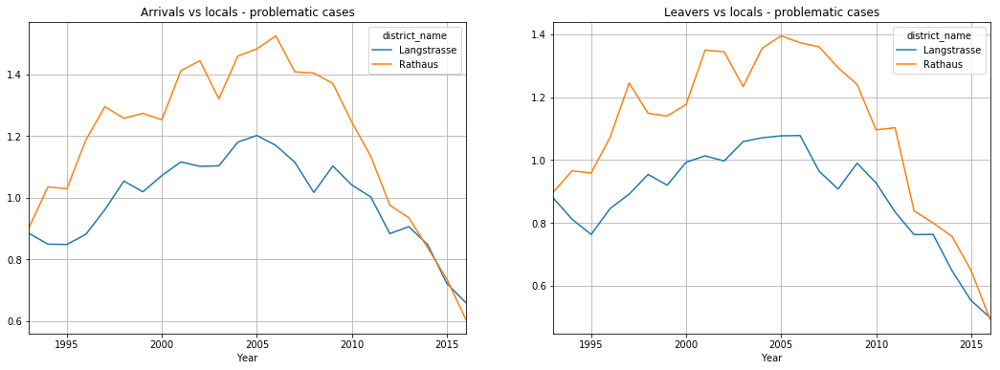

In [23]:
# Plot troublesome districts of Rathaus and Langstrasse
fig, axes = plt.subplots(1, 2, figsize=(18,6))
df_RL1 = df_select_values(arrival_20_ratio, 'district_name', ['Rathaus', 'Langstrasse'])
df_RL1.pivot(values='Total', index='Year',columns='district_name').plot.line(
        ax=axes[0], title='Arrivals vs locals - problematic cases', stacked=False, grid=True)

# Troublesome districts of Rathaus and Langstrasse
df_RL2 = df_select_values(leavers_20_ratio, 'district_name', ['Rathaus', 'Langstrasse'])
df_RL2.pivot(values='Total', index='Year',columns='district_name').plot.line(
        ax=axes[1], title='Leavers vs locals - problematic cases', stacked=False, grid=True)

We can see that for the districts Rathaus and Langstrasse the turnover rates (arrivals vs locals and leavers vs locals) are larger than 1. That means that there are more people registered as arriving/leaving than people who are registed in the district. This could be due to a very fast turn around rate, where people only live in district for a few months before moving on. Thus a flat might have multiple occupants within a given year, but for the local population only one is counted on the cut-off day.

We investigate this problem because it plays a role later on when we wish to generate the probability that some is leaving or staying. Naively using the above ratio as the chance for leaving would create probabilities of more than 1.

## Ratio of men to women - The gender gap <a name="gender_gap"></a>

We analyse the ratio between men and women. First we look at the overall population and then we look at the ratios for people moving to, within and away from Zurich.

### Percentage of women in the overall population

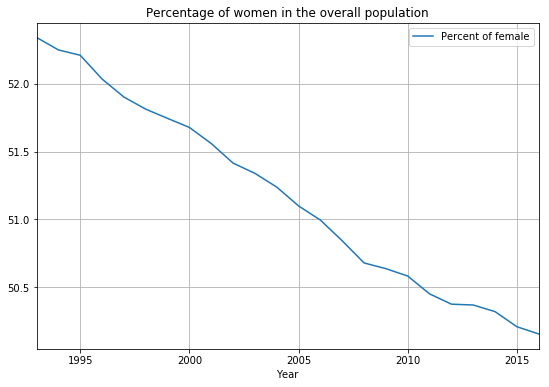

In [24]:
ZH_gender_percent = df_subset_percent(ZH_popul, ['Year'], 'gender', 'Total')

ZH_Female_percent =ZH_gender_percent[ZH_gender_percent['gender']=="F"]
ZH_Female_percent.rename(columns={'Percent of gender': 'Percent of female'}, inplace=True)

ZH_Female_percent.plot.line(x='Year', y='Percent of female', grid=True, figsize=(9,6), title='Percentage of women in the overall population')

We can see that the percentage of women has steadily declined from 52.5% to almost 50%. Hence in the overall population of Zurich the gender gap was in favour of women and has now closed.

### Gender gap amongst movers

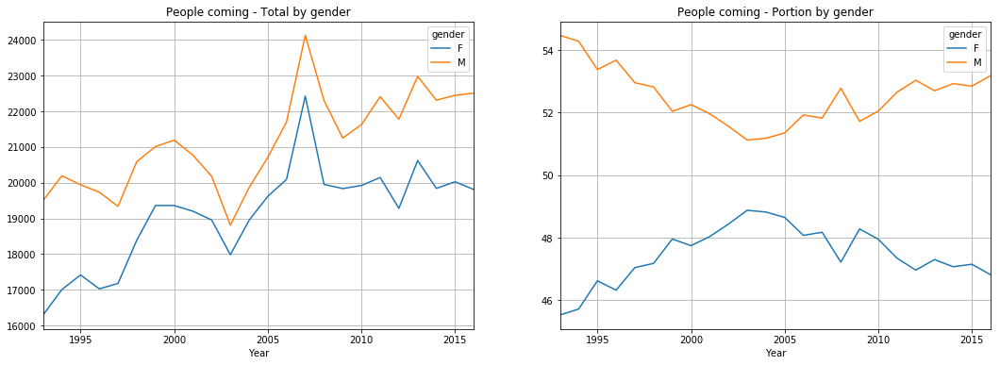

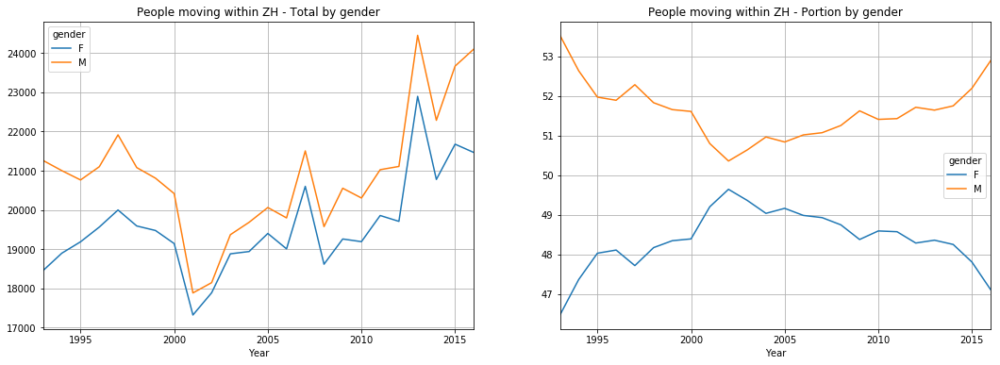

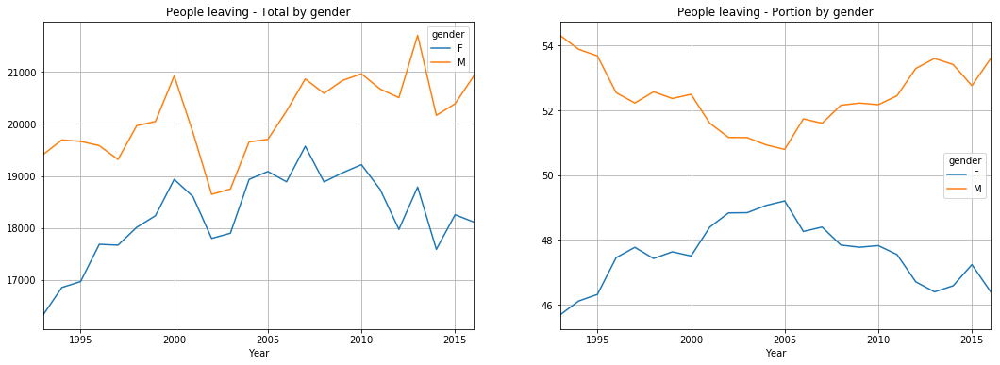

In [25]:
plot_by_feature_annual(ZH_in_df, 'gender', 'Total', 'People coming')

plot_by_feature_annual(ZH_within_df, 'gender', 'Total', 'People moving within ZH')

plot_by_feature_annual(ZH_out_df, 'gender', 'Total', 'People leaving')

# Remark: Female will be automatically plotted in blue and Male in orange. So no stereotypical colours :)

**Observations:** 

The majority of women in the overall population is not reflected at all in the data for people moving. All three scenarios show a clear gender gap favouring men. This is no surprise for people moving to Zurich, as their profile should not be determined by the number of women in Zurich, but instead by factors outside Zurich. However, we would expect that the number of women living in Zurich has an effect on how many move within and away form Zurich over time. This does not appear to be the case as the profiles are similar in all 3 scenarios.

The **absolute numbers** per gender reflect those of the overall numbers of people moving.

ZH_in: We have a dip in 2003 and spike in 2007. 2013 appears to be due to general fluctuations.

ZH_within: We have a sharp drop in for 2001 (wider dip 2001 and 2002) and spikes in 2007 and 2013. 

ZH_out: We have a wider dip in 2002 and 2003. 2013 appears to be due to general fluctuations.

We observe that in all three settings the **gender gap** narrows by 6 percentage points (from 7-8pp to 1-2pp) 

Moreover in each case the dips around 2001-2003 happen a year before or at the same time as the narrowest gender gap and they mark a turning point after which the gap continuously widens again in all settings.

Note that in contrast the spikes of 2007 and 2013 are not reflected in the gender profile, i.e. their origin was equally spread amongst both genders. 

**Conclusion:** 

We can see that, while women make up 50-53% of the city's population, but are less likely to move than men (only 46-47%). Men are more 'nomadic', while women stay for longer in one place.



**Questions and tasks:** 

1) Why do we observe a dip in 2001-2003 and why is the gender gap narrowing reverse thereafter?

2) The scale and trend of the gender gap is similar across all 3 settings. The question arises whether it differs by nationality? Conjecture: Immigrants from some regions are predominantly single men (e.g. Africa). Once in ZH, they create a top up to the single male group of the general population. Can we support this conjecture or is the gender gap apparent for Swiss people and other regions (Western Europe) as well  

3) For married individuals we expect a 50/50 split of gender (check this). 

If true subtracting these should widen the overall gender gap. By how much?

If not does that indicate that some married men live and move like singles, while their wives reside outside ZH?

### The evolution of the gender gap in each district over time

Let's look at the percentage of women for individual districts.

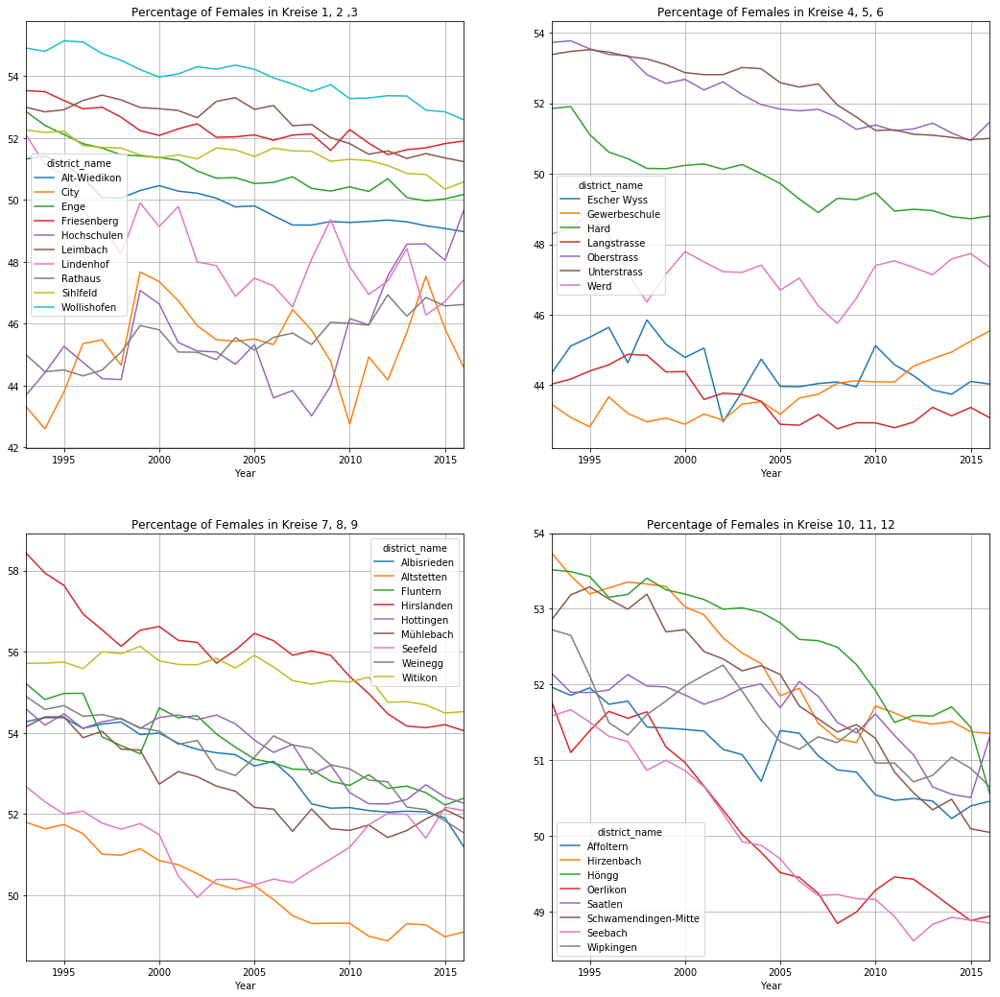

In [26]:
#df_subset_percent(df, retain_groups, percent_group, total_column)
ZH_district_gender_percent = df_subset_percent(ZH_popul, ['Year', 'district_name'], 'gender', 'Total')
# Select females
ZH_district_Female_percent =ZH_district_gender_percent[ZH_district_gender_percent['gender']=="F"]

plot_feature_by_district(ZH_district_Female_percent, 'Percentage of Females', 'Percent of gender')


**Observations**

In 1993, the percentage of women in most districts was above 50% (51%-58%). For all of these districts the proportion has slowly but steadily fallen to 49%-55%, thus narrowing or closing the gender gap. The exceptions are the districts in Kreis 1, 4 and 5, where rates have always been below 50%. Here the proportion oscillates between 42% and 50% (Hard declines from 52% to 49%).

This is in contrast to the observations we made about the consistent gender gap among people arriving in ZH and moving within ZH which could in parts explain the gradual decline above. However even the people leaving ZH were predominantly women. 

** Question**

Since married couples split their part of the population in a 50-50 ratio, the above figures suggest that the ratios of female amongst singles should follow the above trends even more. Since women typically live longer than men and hence outlive them in most marriages, we hence suspect that the portion of female widows is higher than 50%.

## Map showing the female/male ratio of people moving to Zurich

In [27]:
 def year_f_m(y):
    
    ZH_district_gender_percent = df_subset_percent(ZH_in_df, ['Year', 'district_to_name'], 'gender', 'Total')
    # Select females
    ZH_district_Female_percent =ZH_district_gender_percent[ZH_district_gender_percent['gender']=="F"]
    #Select year
    ZH_district_Female_percent_year =ZH_district_Female_percent[ZH_district_Female_percent['Year']==y]
    # Select males
    ZH_district_male_percent =ZH_district_gender_percent[ZH_district_gender_percent['gender']=="M"]
    #Select year
    ZH_district_male_percent_year =ZH_district_male_percent[ZH_district_male_percent['Year']==y]
    return [ZH_district_Female_percent_year,ZH_district_male_percent_year]

In [28]:
#Function that plots the choropleth map
def plotting_gender(y) :
    [ZH_district_Female_percent_year,ZH_district_male_percent_year] = year_f_m(y);
    zurich_geo_path = r'Data/ZH_district_geo.json'
    geo_json_data = json.load(open(zurich_geo_path))
    zh_map = folium.Map(location=[47.3769, 8.5417], zoom_start=12,tiles='cartodbpositron')
    
    
    zh_map.choropleth(geo_data=geo_json_data, data=ZH_district_Female_percent_year,
             name = 'Female',
             columns=['district_to_name',"Percent of gender"],
             key_on='feature.properties.qname',
             fill_color='YlGnBu',
             #threshold_scale = threshold_scale1,
             legend_name='Percentage of females amongst people moving to Zurich'
                     )
    
    zh_map.choropleth(geo_data=geo_json_data, data=ZH_district_male_percent_year,
             name = 'Male',
             columns=['district_to_name',"Percent of gender"],
             key_on='feature.properties.qname',
             fill_color='YlGnBu',
             legend_name='Percentage of males amongst people moving to Zurich')
    folium.LayerControl().add_to(zh_map)
    # display the content on function call
    display(zh_map)



In [29]:
interact(plotting_gender, y = widgets.IntSlider(min=1993, max=2016,step=1))

A Jupyter Widget

<function __main__.plotting_gender>

## Age - The story of the generations <a name="Age"></a>

### Demographics of the city of Zurich

**Description:**

We are interested in the age decomposition of ZH. We had initially split the population into for generations of around 20 years age. However, the group [20-39] was significantly larger. So we decided to split it into young professionals [20-29] and mid professionals [30-39] to get 5 groups of similar scales and get a better picture of the dynamic of the working polulation.

We recall that for the moving data we work with 10-year bins, while population data uses 5-yar bins. The pension age in Switzeralnd is currently 65 for men and 64 for women.

The groups are: 

a) children [0-19], 

b) young professionals [20-29]

c) mid professionals [30-39]

d) older professionals [40-60]

e) seniors [60+] - retired people

Note that 

First we calculate and plot the portions of each group in the overall population of ZH. Then we repeat the analyis at district level.

In [30]:
# Lists for the age groups to be used
children_age5_list = ["0-4", "5-9","10-14","15-19"]
juniorprof_age5_list = ["20-24", "25-29"]
midlevelprof_age5_list = ["30-34", "35-39"]
seniorprof_age5_list = ["40-44", "45-49","50-54","55-59"]
pensioners_age5_list = ["60-64", "65-69","70-74","75-79","80-84","85-89","90-94","95-99","99+"]

children_age10_list = ["0-9","10-19"]
juniorprof_age10_list = ["20-29"]
midlevelprof_age10_list = ["30-39"]
seniorprof_age10_list = ["40-49","50-59"]
pensioners_age10_list = ["60-69","70-79","80-89","90-99","99+"]

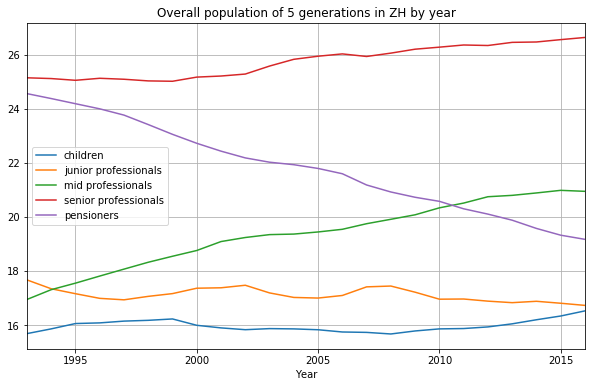

In [31]:
# Annual numbers
ZH_age_percent = df_subset_percent(ZH_popul, ['Year'], 'age_group5', 'Total')
# Annual numbers by district
ZH_district_age_percent = df_subset_percent(ZH_popul, ['Year', 'district_name'], 'age_group5', 'Total')

# Annual numbers
ZH_move_age_percent = df_subset_percent(ZH_within_df, ['Year'], 'age_group', 'Total')
# Annual numbers by district
ZH_move_from_district_age_percent = df_subset_percent(ZH_within_df, ['Year', 'district_from_name'], 'age_group', 'Total')

# Function for finding the annual percentages for the generations in the overall population
def generation_percent(df, selected_column, age_list, column_title):
    df_generation_percent =df_select_values(df, selected_column, age_list)
    df_generation_percent =df_subset_total(df_generation_percent, "Year", "Percent of "+selected_column).set_index('Year')
    df_generation_percent.rename(columns={'Total': column_title}, inplace=True)
    return df_generation_percent;

# Apply function to our 5 generations
# ZH population
ZH_children_percent = generation_percent(ZH_age_percent, "age_group5", children_age5_list, 'children')
ZH_juniorprof_percent = generation_percent(ZH_age_percent, "age_group5", juniorprof_age5_list, 'junior professionals')
ZH_midlevelprof_percent = generation_percent(ZH_age_percent, "age_group5", midlevelprof_age5_list, 'mid professionals')
ZH_seniorprof_percent = generation_percent(ZH_age_percent, "age_group5", seniorprof_age5_list, 'senior professionals')
ZH_pensioners_percent = generation_percent(ZH_age_percent, "age_group5", pensioners_age5_list, 'pensioners')

# Join the five dataframes and plot them in one graph
ZH_generations = pd.concat([ZH_children_percent, ZH_juniorprof_percent, ZH_midlevelprof_percent, ZH_seniorprof_percent, ZH_pensioners_percent], axis=1 )
ZH_generations.plot.line(title='Overall population of 5 generations in ZH by year', grid=True,figsize=(10,6) )


### Demographics of movers

#### People coming to Zurich

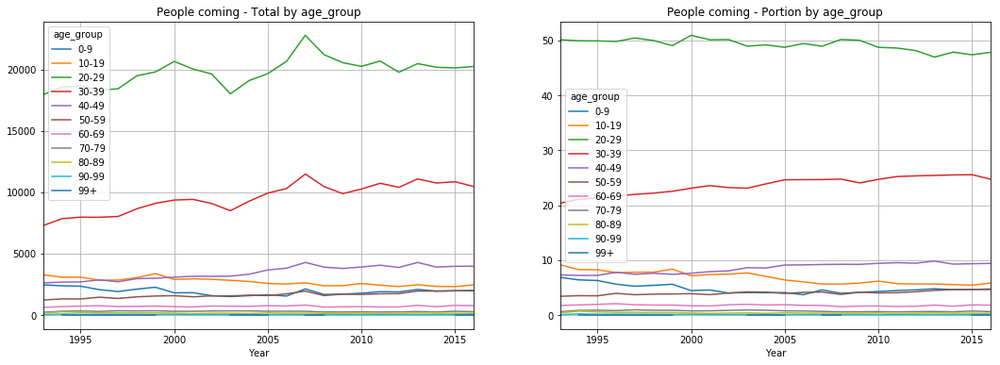

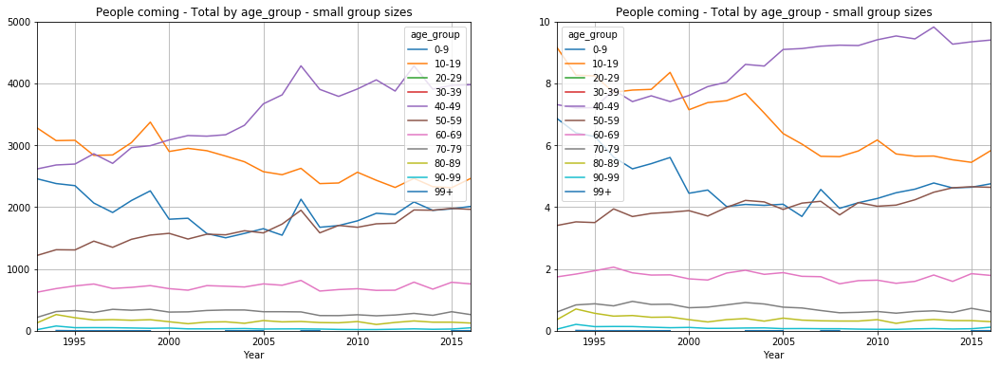

In [32]:
# In
plot_by_feature_annual(ZH_in_df, 'age_group', 'Total', 'People coming', add_small_plot=True)

#### People moving within Zurich

People moving within Zurich
  


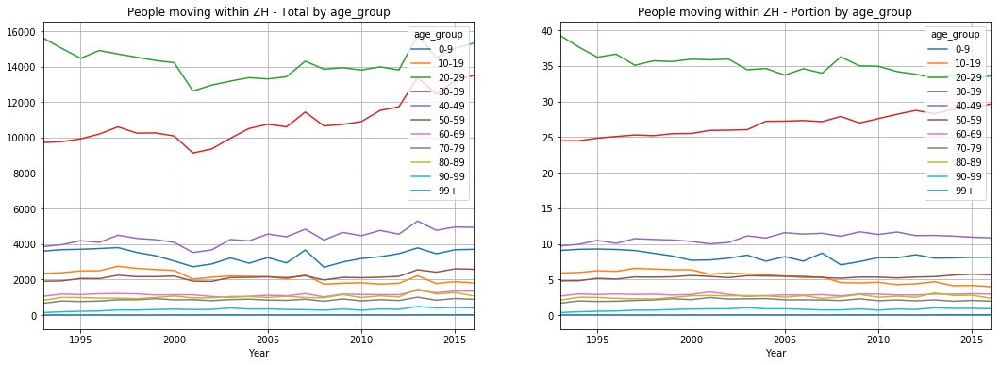

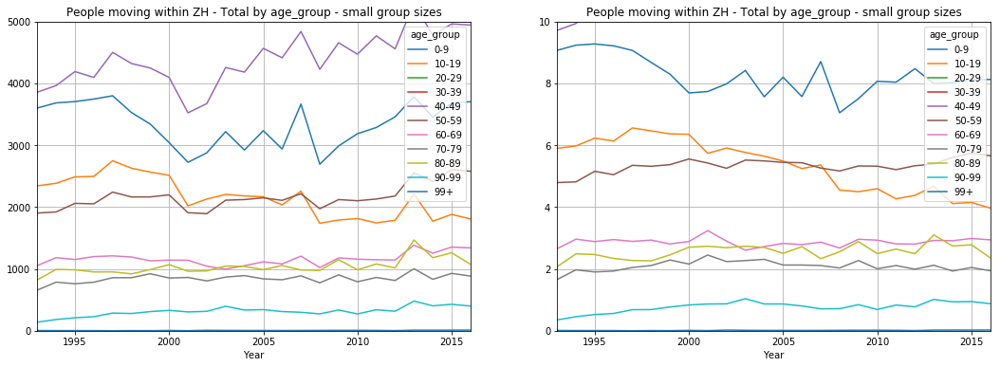

In [33]:
#Within
print('People moving within Zurich')
plot_by_feature_annual(ZH_within_df, 'age_group', 'Total', 'People moving within ZH', add_small_plot=True)

#### People leaving Zurich

People leaving Zurich
  


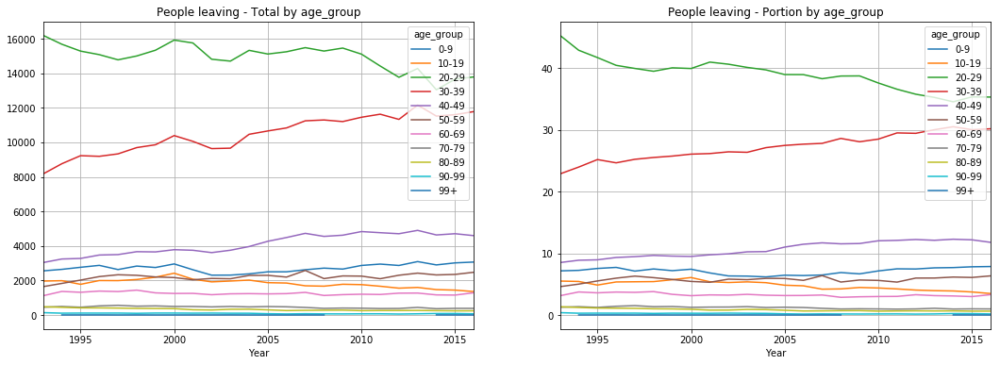

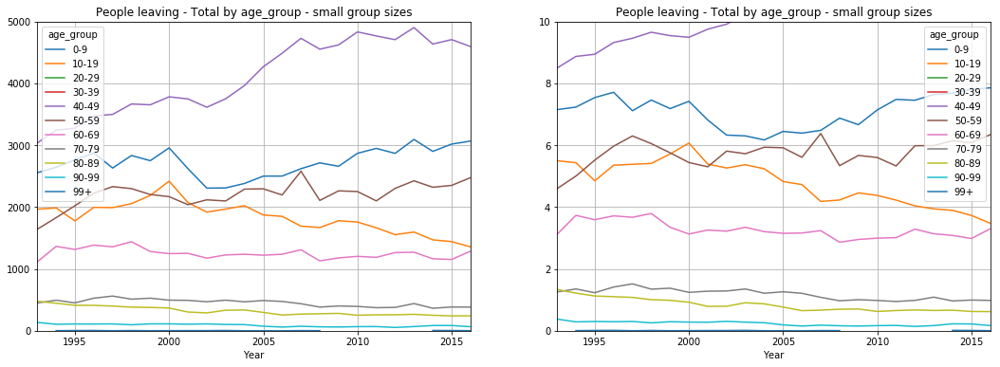

In [34]:
# Out
print('People leaving Zurich')
plot_by_feature_annual(ZH_out_df, 'age_group', 'Total', 'People leaving', add_small_plot=True)

**Observations:** 

1) In all 3 cases the strongest groups are '20-29', then '30-39' and '40-49'. 

2) The total number of '20-29' is (up - in, steady - within, down - out).
 
The portion of '20-29' decreases over time by (-2.3% in, -5.7% within, -10% out). We could say that this age group becomes more 'sesshaft' - in relative terms.

3) There is a significant increase of the total number of '30-39' moving in general. We could conclude that people in this group decide/are  for forced to move more often. (Need comparison against overall population.)

The portion of '30-39' increases over time by (4.3% in, 5.1% within, 7.3% out). We could say that this age group becomes more 'mobile' - in relative terms.

4) Comparing children '0-9' and '10-19'. The groups are typically ranked 4 and 5.
There are more '10-19' moving to ZH, whereas '0-9' are more likely to move within ZH or leave ZH.

The total number of ‘10-19’ decreases in all 3 scenarios.

ZH_in: 1999 sees a brief spike for both age groups (not reflected in any other age group!)), and for '0-9' the spike of 2007 follows the general trend, but for ‘10-19’ it is absent. 

ZH_within: The drop of 2001 and the spikes of 2007 and 2013 are matched by both sets. 

ZH_out: 2013 on the other hand appears not noticeable for ZH_out in either group.

5) The groups 60+ , with pensioners or those close to retirement, generally do not move as much. This is particularly noticeable ZH_in where their portion is generally smaller than in the other two cases. 

’60-69’ make up around 2%,3%,4% of the three groups (in, within, out). For ZH_in  and ZH_out they set themselves apart from the older groups, whereas all the age groups 60+ for ZH_within are on comparable sales.

The profiles for the groups 60+, does not show the dips around 2001-2003, nor the spikes of 2007 or 2013. This suggest that events related to those dips and spikes did not affect pensioners. In other words those events appear to be related to the economy, affecting household incomes (but not pensions). 

#### Questions and Tasks

Quantify and make a visual comparison between portions of individual subgroups for in, within, out and total population.

1) Can we say that there was a particular change overtime?

2) For which group is the portion of against the overall population changing most significantly?

3) Plot percentage change against 1993 value for each group. Expect [20-29] steady in all 3, [30-39] up by 30% in all 3. What about the other ones? Trend appears to depend on age_group and in/within/out.

4) Are these trends similar when we focus on single/married/divorced people? (Later are a mix of the first two as they are more likely to have kids and in that case be constraint by ex-partners wanting access.)


### Alternative comparison of the age group distributions for 1993, 2004 and 2016 using bar charts

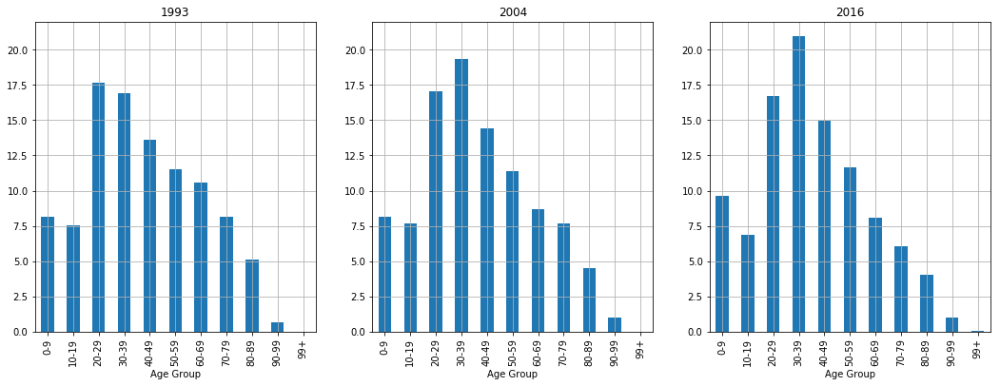

In [35]:
age_groups = ZH_popul

# Change the age intervall from a span of 5 years to 10 years.
age_groups = age_groups.replace(['0-4','5-9'], '0-9')
age_groups = age_groups.replace('5-9', '0-9')
age_groups = age_groups.replace('10-14', '10-19')
age_groups = age_groups.replace('15-19', '10-19')
age_groups = age_groups.replace('20-24', '20-29')
age_groups = age_groups.replace('25-29', '20-29')
age_groups = age_groups.replace('30-34', '30-39')
age_groups = age_groups.replace('35-39', '30-39')
age_groups = age_groups.replace('40-44', '40-49')
age_groups = age_groups.replace('45-49', '40-49')
age_groups = age_groups.replace('50-54', '50-59')
age_groups = age_groups.replace('55-59', '50-59')
age_groups = age_groups.replace('60-64', '60-69')
age_groups = age_groups.replace('65-69', '60-69')
age_groups = age_groups.replace('70-74', '70-79')
age_groups = age_groups.replace('75-79', '70-79')
age_groups = age_groups.replace('80-84', '80-89')
age_groups = age_groups.replace('85-89', '80-89')
age_groups = age_groups.replace('90-94', '90-99')
age_groups = age_groups.replace('95-99', '90-99')

age_groups = df_subset_percent(age_groups, 'Year', 'age_group5','Total')
age_groups = age_groups.rename(columns={"age_group5": "Age Group"})

# Age groups for 1993
age_groups_1993 = age_groups[age_groups['Year']==1993]
age_groups_1993 = age_groups_1993.set_index("Age Group")

# Age group for 2004
age_groups_2004 = age_groups[age_groups['Year']==2004]
age_groups_2004 = age_groups_2004.set_index("Age Group")

# Age group for 2016
age_groups_2016 = age_groups[age_groups['Year']==2016]
age_groups_2016 = age_groups_2016.set_index("Age Group")

# Plot bar plots for the distributions
fig, axes = plt.subplots(1, 3, figsize=(18,6))
age_groups_1993["Percent of age_group5"].plot.bar(ax=axes[0],y='Percent',x='Age Group', ylim=[0,22], title='1993', grid=True)

age_groups_2004["Percent of age_group5"].plot.bar(ax=axes[1],y='Percent',x='Age Group', ylim=[0,22], title='2004', grid=True)

age_groups_2016["Percent of age_group5"].plot.bar(ax=axes[2],y='Percent', x='Age Group', ylim=[0,22],title='2016', grid=True)

### Demographics at district level

In [36]:
# Finding the annual percentages for children, young professionals and seniors in the overall population

def district_generation_percent(df, selected_column, age_list):
    df_district_generation_percent =df_select_values(df, selected_column, age_list)
    df_district_generation_percent =df_subset_total(df_district_generation_percent, 
                                                    ["Year", "district_name"], "Percent of "+ selected_column)
    df_district_generation_percent.rename(columns={'Total': 'Percent'}, inplace=True)
    return df_district_generation_percent;

# def generation_percent(df, selected_column, age_list, column_title):
#     df_generation_percent =df_select_values(df, selected_column, age_list)
#     df_generation_percent =df_subset_total(df_generation_percent, "Year", "Percent of "+selected_column).set_index('Year')
#     df_generation_percent.rename(columns={'Total': column_title}, inplace=True)
#     return df_generation_percent;

#df_select_values(df, selected_column, value_list):
ZH_district_children_percent = district_generation_percent(ZH_district_age_percent, "age_group5", children_age5_list)
ZH_district_juniorprof_percent = district_generation_percent(ZH_district_age_percent, "age_group5", juniorprof_age5_list)
ZH_district_midlevelprof_percent = district_generation_percent(ZH_district_age_percent, "age_group5", midlevelprof_age5_list)
ZH_district_seniorprof_percent = district_generation_percent(ZH_district_age_percent, "age_group5", seniorprof_age5_list)
ZH_district_pensioners_percent = district_generation_percent(ZH_district_age_percent, "age_group5", pensioners_age5_list)

In [37]:
ZH_district_children_percent.sample(10)

,Year,district_name,Percent
702,2013,Rathaus,8.140263
259,2000,Oerlikon,14.885881
200,1998,Werd,13.697930
369,2003,Weinegg,14.682958
797,2016,Höngg,17.354737
310,2002,City,16.813187
2,1993,Alt-Wiedikon,14.231058
3,1993,Altstetten,16.798823
642,2011,Werd,12.604440
701,2013,Oerlikon,13.939422


#### Percentage of children per district over time

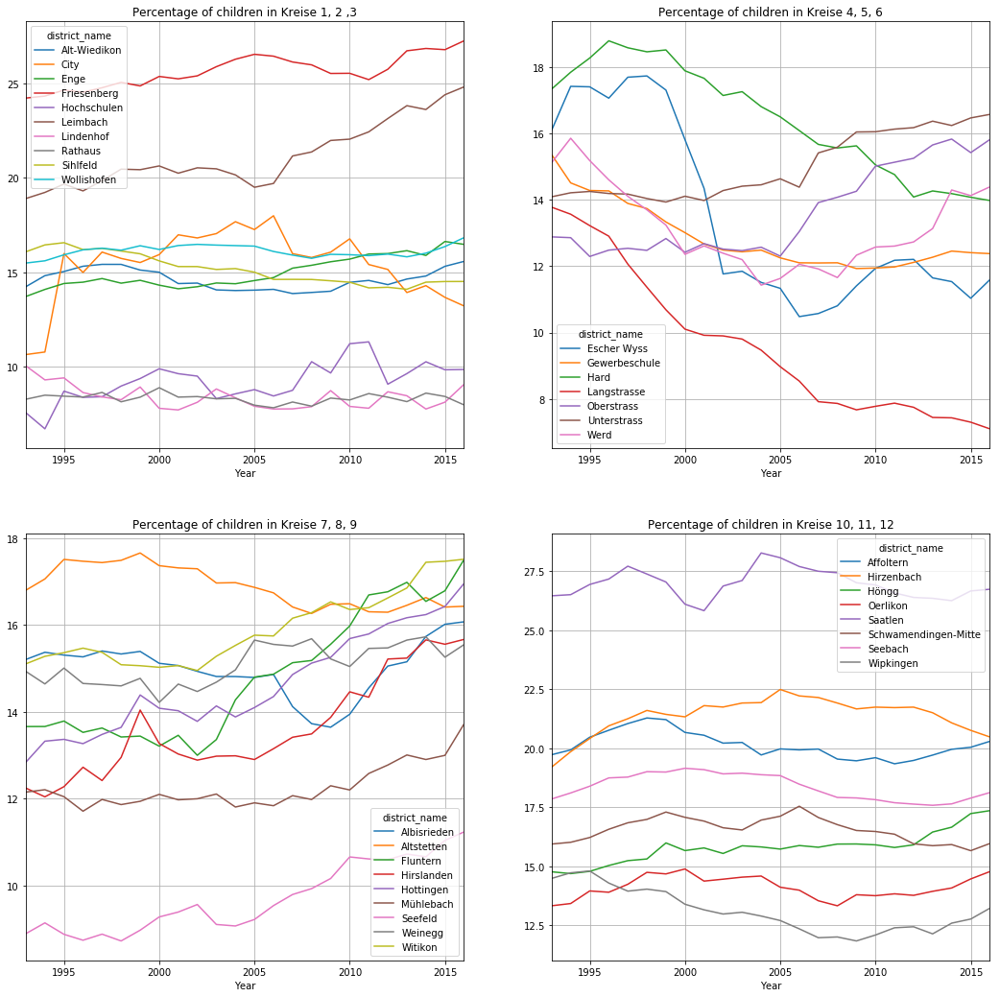

In [38]:
plot_feature_by_district(ZH_district_children_percent, 'Percentage of children', 'Percent')

#### Percentage of junior professionals per district over time

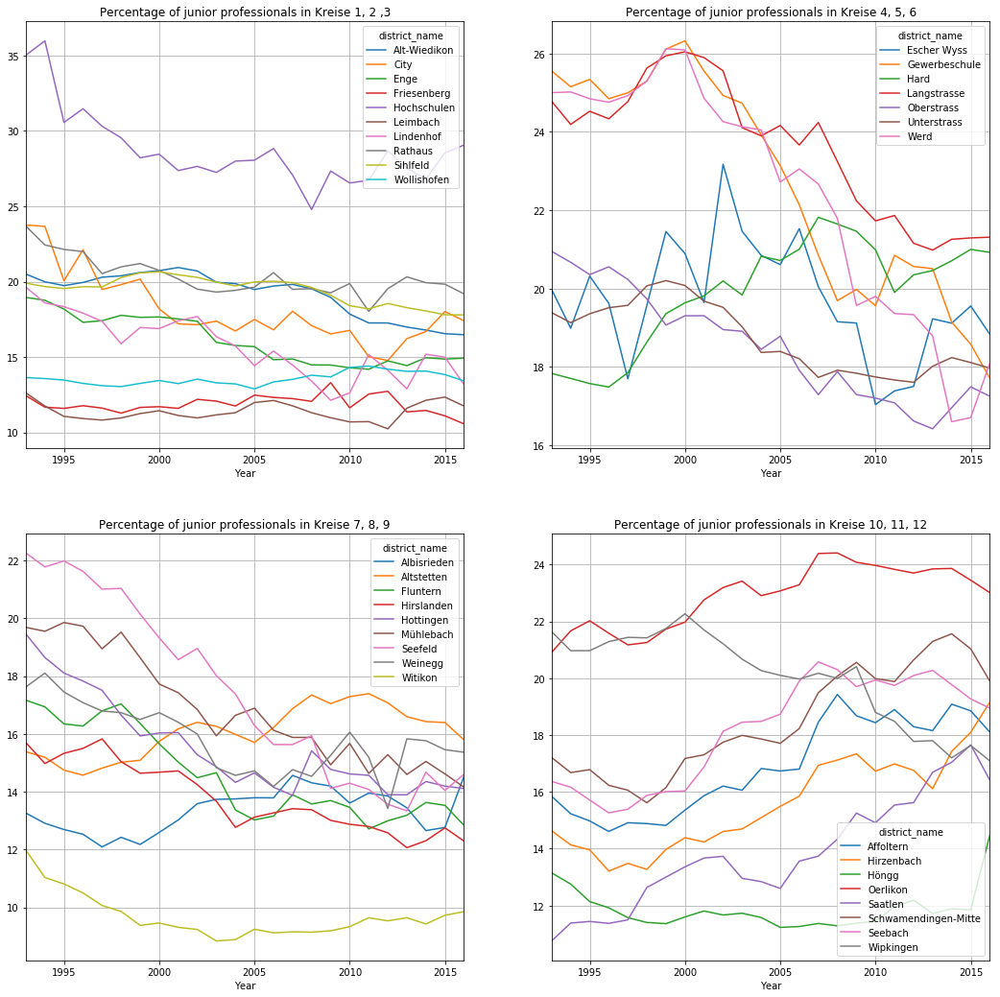

In [39]:
plot_feature_by_district(ZH_district_juniorprof_percent, 'Percentage of junior professionals', 'Percent')

#### Percentage of mid-level professionals per district over time

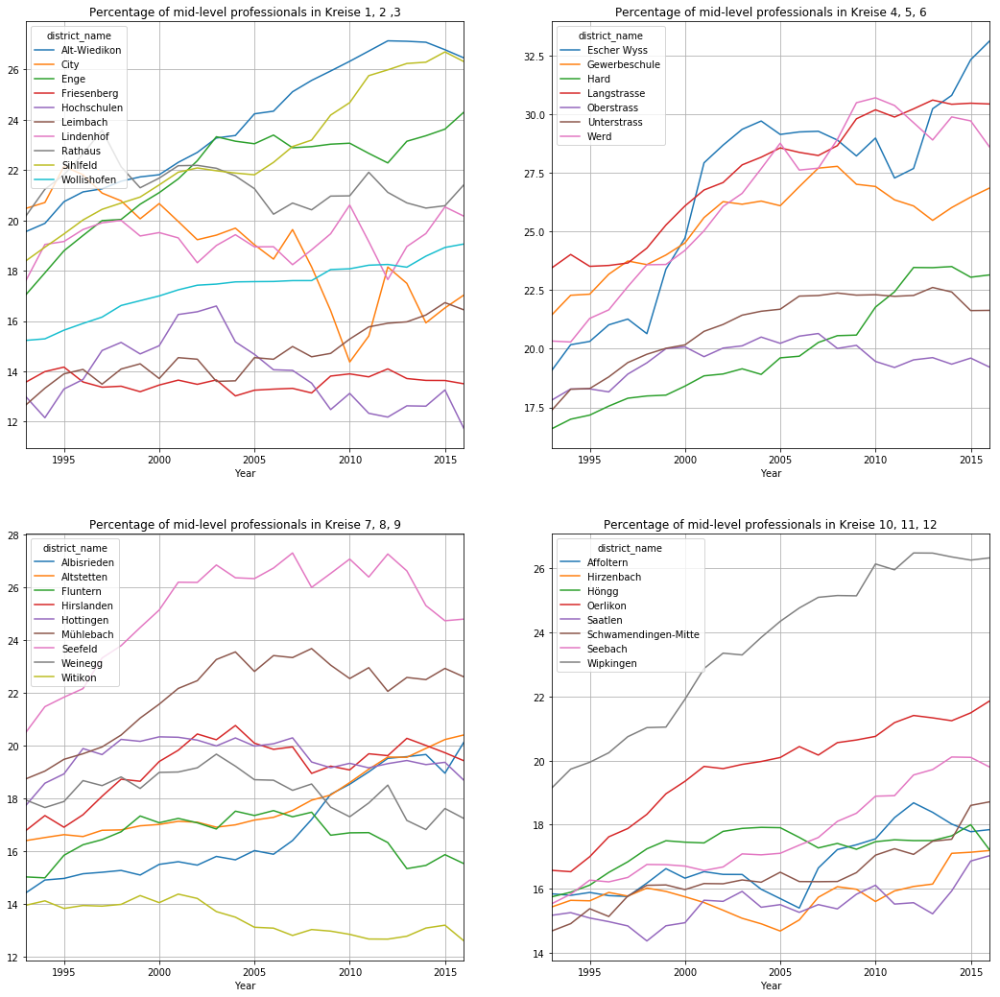

In [40]:
plot_feature_by_district(ZH_district_midlevelprof_percent, 'Percentage of mid-level professionals', 'Percent')

#### Percentage of senior professionals per district over time

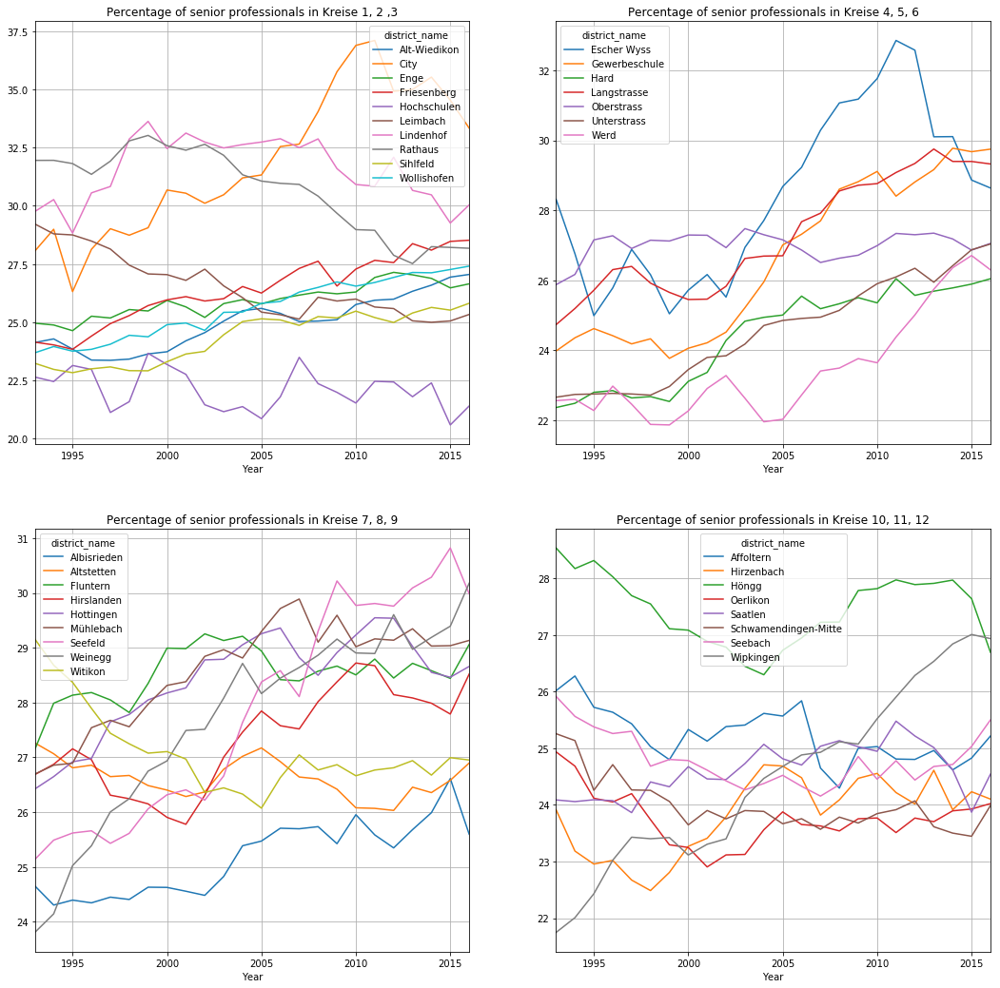

In [41]:
plot_feature_by_district(ZH_district_seniorprof_percent, 'Percentage of senior professionals', 'Percent')

#### Percentage of pensioners per district over time

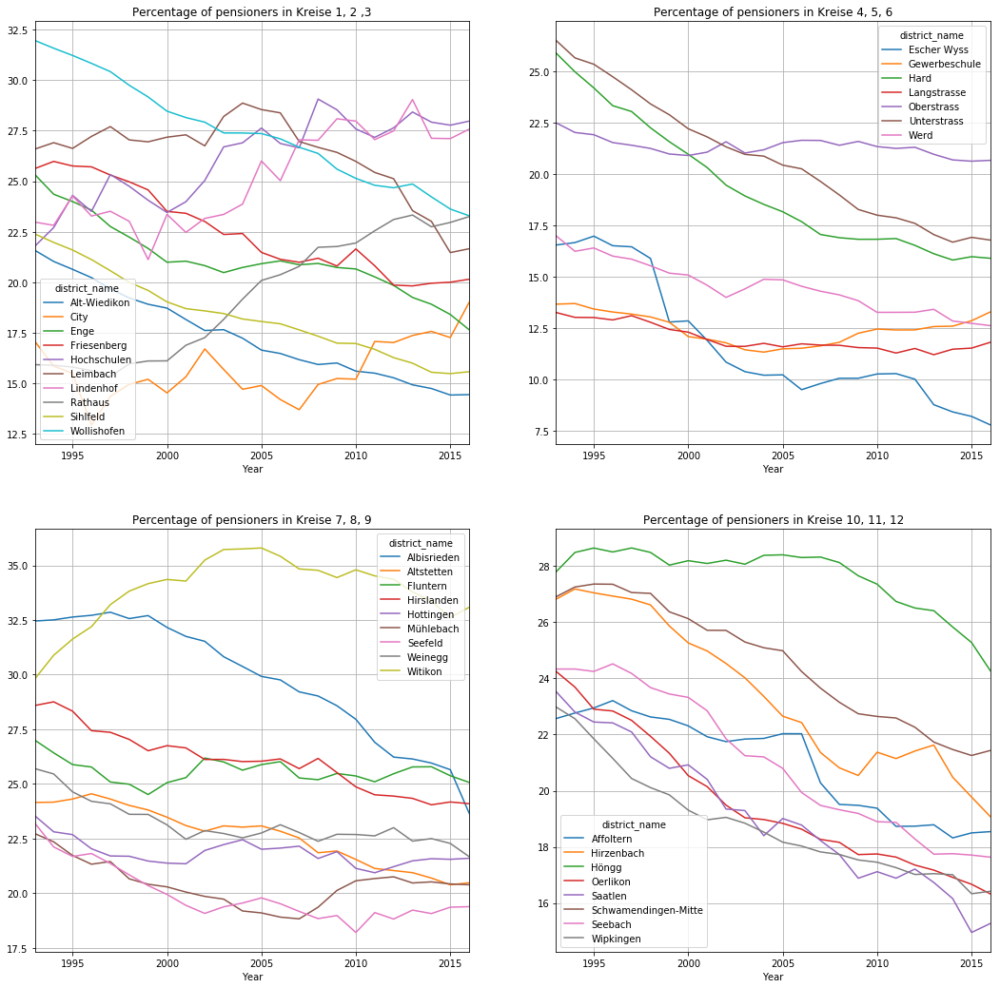

In [42]:
plot_feature_by_district(ZH_district_pensioners_percent, 'Percentage of pensioners', 'Percent')

**Observations**

 We see that the percentages of children and young professionals in the overall population are stable over the years. The age group 30-39 increases from 17% to 21% which means their actual numbers will have risen by over 20%. In contrast the portion of 60+ has declined. As the city grows their portion steadily dropped from 19% to 15%.
 
 Overall the city has gotten 'younger in the middle ages', as the shift is driven by the number of people in their '30-39' and not as usually expected by the lower age groups.

For children, there is no general trend apart from some isolated districts that had increases. Escher Wyss had a sharp decline in the early 2000. For Langstrasse the decline was more even over the full 23 years. We will see later that both observations concur with significant population growth in both districts. The declining number of children is related to the incoming new residents being predominantly junior or mid-level professionals. 

Junior professionals (20-29) found most of Kreis 4,5 and 6 unattractive. Similar observations hold for some districts in Kreis 7-9. Instead  they preferred to move to districts 10-12.



### Map of different generations moving within Zurich

In these map we compare the percentage of how many of the people moving to a certain district is from different age groups. The age groups are devided into children, age 0-19, young professionals, age 20-29, mid age professionals, age 30-39, senior professionals, age 40-59 and pensioners, age 60+. In this case we use the moving within data set.

In [43]:
# Finding the annual percentages for generations in the overall population
def age_group_year(year):
    # Relabel dataframe for convenience
    df=ZH_move_from_district_age_percent
    df.rename(columns = {'district_from_name' : 'district_name'}, inplace=True)

    # Apply district_generation_percent function to movers within ZH
    children = district_generation_percent(df, "age_group", children_age10_list)
    juniorprof = district_generation_percent(df, "age_group", juniorprof_age10_list)
    midlevelprof = district_generation_percent(df, "age_group", midlevelprof_age10_list)
    seniorprof = district_generation_percent(df, "age_group", seniorprof_age10_list)
    pensioners = district_generation_percent(df, "age_group", pensioners_age10_list)

    children_year=children[children.Year == year]
    juniorprof_year=juniorprof[juniorprof.Year == year]
    midlevelprof_year=midlevelprof[midlevelprof.Year == year]
    seniorprof_year=seniorprof[seniorprof.Year == year]
    pensioners_year=pensioners[pensioners.Year == year]
    
    return [children_year, juniorprof_year, midlevelprof_year, seniorprof_year, pensioners_year]



In [44]:
#Function that plots the choropleth map
def plotting_age1(year) :
    [children_year, juniorprof_year, midlevelprof_year, seniorprof_year, pensioners_year] = age_group_year(year)
    zurich_geo_path = r'Data/ZH_district_geo.json'
    geo_json_data = json.load(open(zurich_geo_path))
    zh_map1 = folium.Map(location=[47.3769, 8.5417], zoom_start=12,tiles='cartodbpositron')

    threshold_scale = np.linspace(children_year['Percent'].min(),
                              children_year['Percent'].max(),
                              10, dtype=int)
    threshold_scale1 = threshold_scale.tolist()
    
    zh_map1.choropleth(geo_data=geo_json_data, 
                       data=children_year, 
                       name="Children", 
                       columns=['district_name','Percent'], 
                       key_on='feature.properties.qname', 
                       fill_color='YlGnBu', 
                       #threshold_scale = threshold_scale1, 
                       legend_name='Portion of children amongst people moving to a district' )
    
    zh_map1.choropleth(geo_data=geo_json_data, 
                       data=juniorprof_year, 
                       name = 'Young professionals', 
                       columns=['district_name','Percent'], 
                       key_on='feature.properties.qname', 
                       fill_color='YlGnBu', 
                       legend_name='Portion of junior professionals moving to a district' )
    
    folium.LayerControl().add_to(zh_map1)
    # display the content on function call
    display(zh_map1)


In [45]:
interact(plotting_age1, year = widgets.IntSlider(min=1993, max=2016,step=1))

A Jupyter Widget

<function __main__.plotting_age1>

In [46]:
#Function that plots the choropleth map
def plotting_age2(year) :
    [children_year, juniorprof_year, midlevelprof_year, seniorprof_year, pensioners_year] = age_group_year(year)
    zurich_geo_path = r'Data/ZH_district_geo.json'
    geo_json_data = json.load(open(zurich_geo_path))
    zh_map2 = folium.Map(location=[47.3769, 8.5417], zoom_start=12,tiles='cartodbpositron')
    
    threshold_scale = np.linspace(0,40,10, dtype=int)
    threshold_scale1 = threshold_scale.tolist()
    
    zh_map2.choropleth(geo_data=geo_json_data, 
                       data=midlevelprof_year, 
                       name = 'Mid-level professionals', 
                       columns=['district_name','Percent'], 
                       key_on='feature.properties.qname', 
                       fill_color='YlGnBu', 
                       legend_name='Portion of mid-level professionals moving to a district')
    
    zh_map2.choropleth(geo_data=geo_json_data, 
                       data=seniorprof_year, 
                       name = 'Senior professionals',
                       columns=['district_name','Percent'], 
                       key_on='feature.properties.qname', 
                       fill_color='YlGnBu', 
                       legend_name='Portion of senior professionals moving to a district' )
    
    folium.LayerControl().add_to(zh_map2)
    # display the content on function call
    display(zh_map2)
    

In [47]:
interact(plotting_age2, year = widgets.IntSlider(min=1993, max=2016,step=1))

A Jupyter Widget

<function __main__.plotting_age2>

In [48]:
#Function that plots the choropleth map
def plotting_age3(year) :
    [children_year, juniorprof_year, midlevelprof_year, seniorprof_year, pensioners_year] = age_group_year(year)
    zurich_geo_path = r'Data/ZH_district_geo.json'
    geo_json_data = json.load(open(zurich_geo_path))
    zh_map3 = folium.Map(location=[47.3769, 8.5417], zoom_start=12,tiles='cartodbpositron')

    threshold_scale = np.linspace(0,40,10, dtype=int)
    threshold_scale1 = threshold_scale.tolist()
    
    zh_map3.choropleth(geo_data=geo_json_data, 
                       data=pensioners_year, 
                       name = 'Pensioners', 
                       columns=['district_name','Percent'], 
                       key_on='feature.properties.qname', 
                       fill_color='YlGnBu', 
                       legend_name='Portion of pensioners moving to a district' )
    
    folium.LayerControl().add_to(zh_map3)
    # display the content on function call
    display(zh_map3)
    

In [49]:
interact(plotting_age3, year = widgets.IntSlider(min=1993, max=2016,step=1))

A Jupyter Widget

<function __main__.plotting_age3>

## Single or married <a name="single_married"></a>

### Annual number of moves by marital status

Marital status is classified into the following groups: singles, married people, divorced, widows and since 2007 also registered or disolved partnerships.

This feature is only available in the moving data. Since groups sizes differ quite a bit, we re-plot small groups in an additional plot.

#### People coming to Zurich

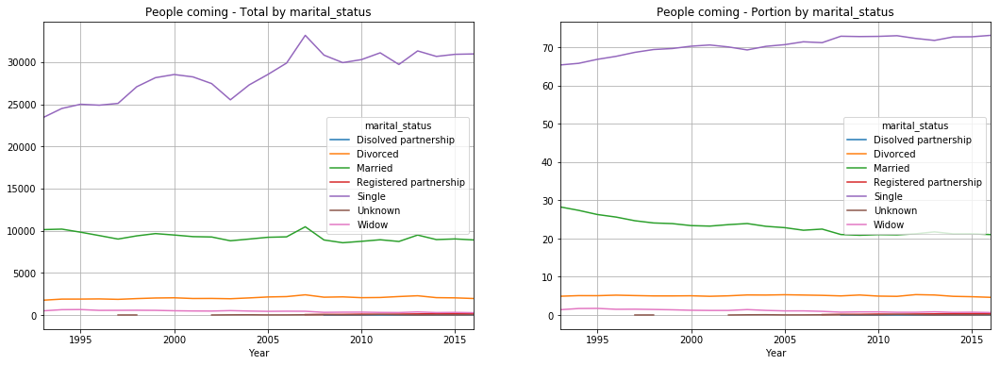

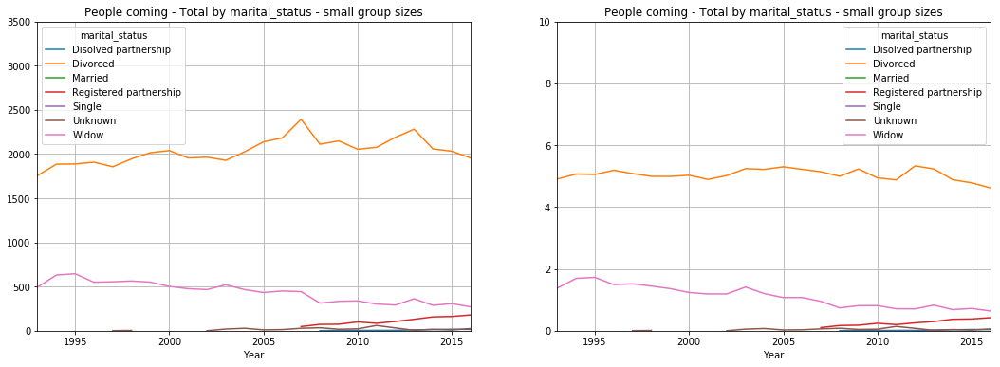

In [50]:
plot_by_feature_annual(ZH_in_df, 'marital_status', 'Total', 'People coming', add_small_plot=True, ymax_total=3500)

#### People moving within Zurich

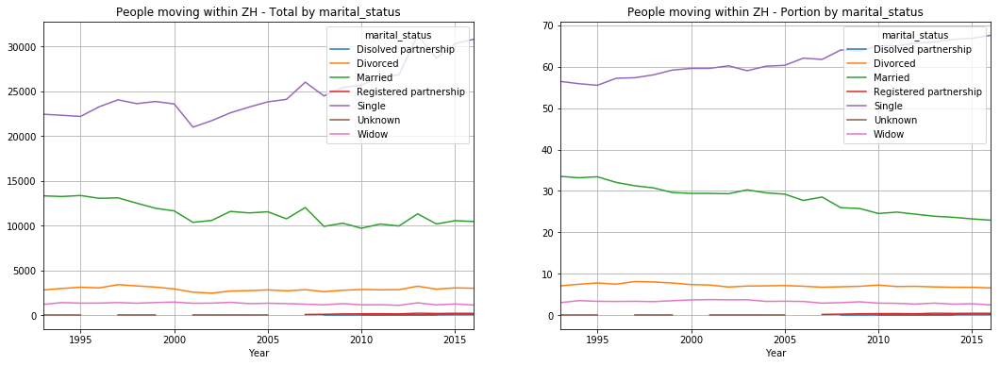

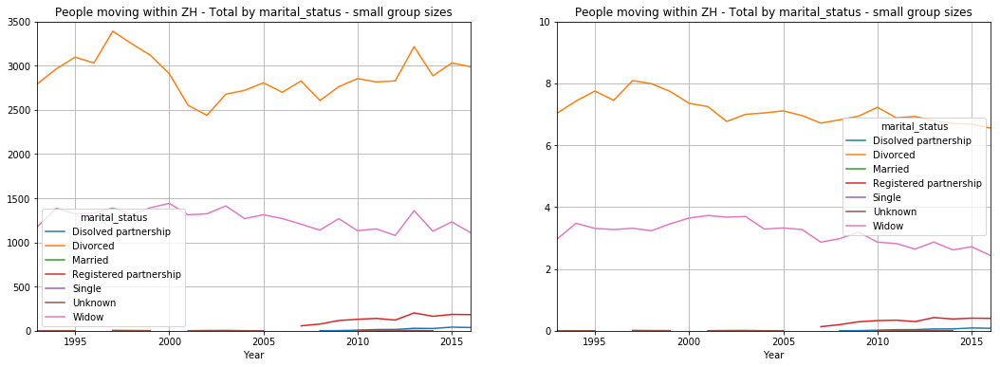

In [51]:
plot_by_feature_annual(ZH_within_df, 'marital_status', 'Total', 'People moving within ZH', add_small_plot=True, ymax_total=3500)

#### People leaving Zurich

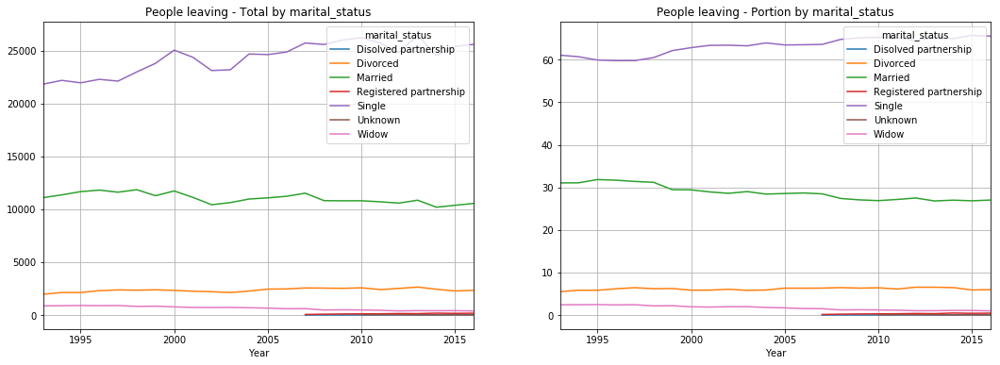

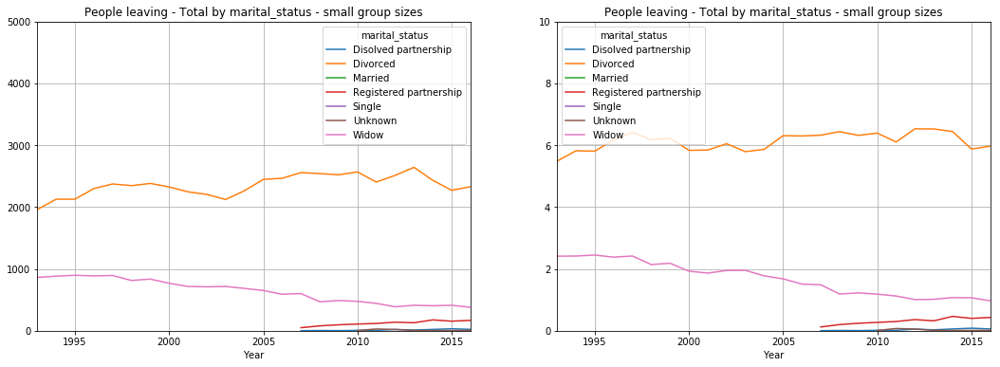

In [52]:
plot_by_feature_annual(ZH_out_df, 'marital_status', 'Total', 'People leaving', add_small_plot=True)

** Remarks:**

Note single adult people are individual moves, while children count as single but are dependants. So the number of moves involving indviduals is lower.

Instead, children form part of a family that moves, i.e. track the move of 2 married people (or divorced). So for married people the numbers halve to get household moves.

**Observations:** 

Singles: In all three cases they make up more than half of the people moving. Unlike other groups their numbers has also increased over time leading to their portion of the population rising by 5-10% over time. 

Married or divorced people: In all three cases their number has been very steady over the last decade.
 
Widows: Unlike the other groups the number of widows moving to or out of Zurich has gradualy decline to around half of the numbers in the early 90s. In contrast for moves within Zurich their numbers have been steady.

Registered  partnerships: It appears the option was added in 2007 and since then numbers have increased steadily. However, it is likely that the effect arises due to i) an increased number of these partnerships in general, and ii) a growing acceptance of this status so that people feel comfortable to register it.

Singles and divorced people are the only groups that clearly exhibit the same trends as the economy (SPI index).

**Questions and tasks:** 

If we are interested in the number of households moving (independent units) then we should consider dropping children and halve the number of married people.

For comparison look for time series of the number of singles and married people in the overall population. The population data does not contain this feature.

## Map single/married

In [53]:
 def year_s_m(y):
    ZH_district_gender_percent = df_subset_percent(ZH_in_df, ['Year', 'district_to_name'], 'marital_status', 'Total')
    # Select females
    ZH_district_single_percent =ZH_district_gender_percent[ZH_district_gender_percent['marital_status']=="Single"]
    #Select year
    ZH_district_single_percent_year =ZH_district_single_percent[ZH_district_single_percent['Year']==y]
    # Select males
    ZH_district_married_percent =ZH_district_gender_percent[ZH_district_gender_percent['marital_status']=="Married"]
    #Select year
    ZH_district_married_percent_year =ZH_district_married_percent[ZH_district_married_percent['Year']==y]
    return [ZH_district_single_percent_year,ZH_district_married_percent_year]

In [54]:
#Function that plots the choropleth map

def plotting_marital_status(y) :
    [ZH_district_single_percent_year,ZH_district_married_percent_year] = year_s_m(y);
    zurich_geo_path = r'Data/ZH_district_geo.json'
    geo_json_data = json.load(open(zurich_geo_path))
    zh_map = folium.Map(location=[47.3769, 8.5417], zoom_start=12,tiles='cartodbpositron')

    zh_map.choropleth(geo_data=geo_json_data, data=ZH_district_single_percent_year,
             name = 'Single',
             columns=['district_to_name',"Percent of marital_status"],
             key_on='feature.properties.qname',
             fill_color='RdYlBu',
             #threshold_scale = threshold_scale1,
             legend_name='Percentage of single moving in compared to overall movement between single and married'
                     )
    
    zh_map.choropleth(geo_data=geo_json_data, data=ZH_district_married_percent_year,
             name = 'Married',
             columns=['district_to_name',"Percent of marital_status"],
             key_on='feature.properties.qname',
             fill_color='RdYlBu',
             legend_name='Percentage of married moving in compared to overall movement between single and married'
             #legend_name='Percentage of male moving in compared to district population'
                     )
    folium.LayerControl().add_to(zh_map)
    # display the content on function call
    display(zh_map)

In [55]:
y = 1997
# Create a slider widget for changeing the year

#Interact calls the plotting function with the widget values and plots the new map
interact(plotting_marital_status, y = widgets.IntSlider(min=1993, max=2016,step=1))

A Jupyter Widget

<function __main__.plotting_marital_status>

## Swiss and Foreigners <a name="foreigners"></a>

#### Percentage of foreigners per district over time

We calculate the percentage of amongst the population a) in ZH, b) in each district. This allows us to measure how international individual districts are.

We want to analyse these rates over time to see whether districts became more diverse or less. 

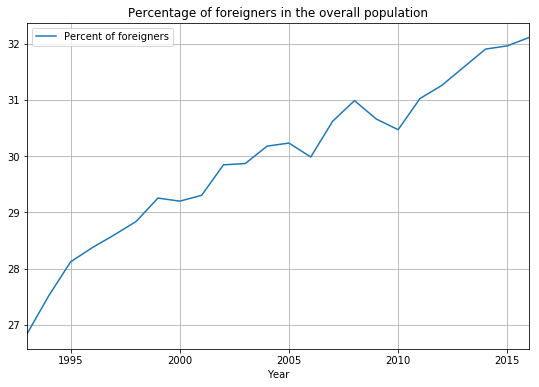

In [56]:
# Calculate the annual total number of foreigners in ZH and their portion of the ZH population

ZH_CHnonCH_percent = df_subset_percent(ZH_popul, ['Year'], 'CH_nonCH', 'Total')
ZH_Foreign_percent =ZH_CHnonCH_percent[ZH_CHnonCH_percent['CH_nonCH']=="Foreign"]


ZH_Foreign_percent.rename(columns={'Percent of CH_nonCH': 'Percent of foreigners'}, inplace=True)

ZH_Foreign_percent.plot.line(x='Year', y='Percent of foreigners', grid=True, figsize=(9,6), title='Percentage of foreigners in the overall population')

We can see that the overall population has clearly become more international. The rate of foreigners has steadily increased from 27% to 32%, there is now 1 foreigner for every 2 Swiss people.

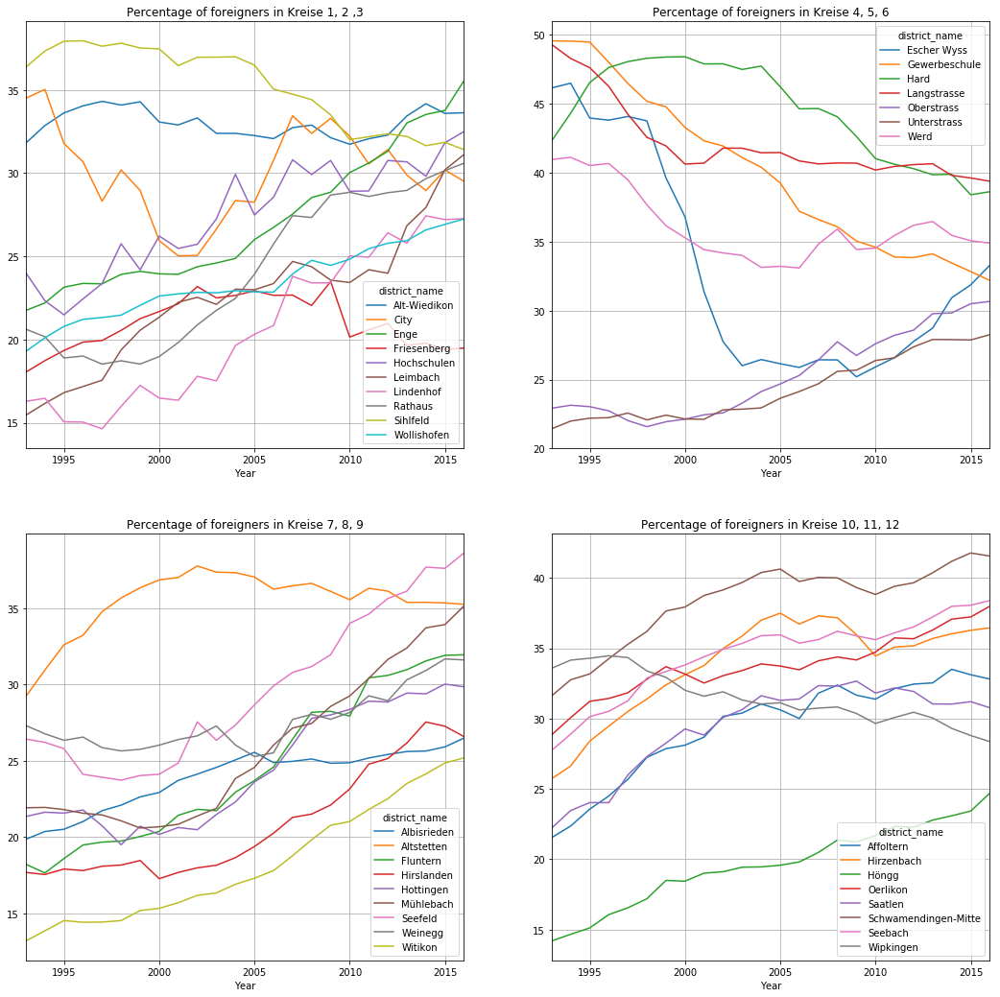

In [57]:
# Calculate the annual number of foreigners per dictrict and their portion of the district population
ZH_district_CHnonCH_total = df_subset_total(ZH_popul, ['Year', 'district_name','CH_nonCH'], 'Total')
ZH_district_CHnonCH_percent = df_subset_percent(ZH_popul, ['Year', 'district_name'], 'CH_nonCH', 'Total')
# Select Swiss
ZH_district_CH_total =ZH_district_CHnonCH_total[ZH_district_CHnonCH_total['CH_nonCH']=="Swiss"]
ZH_district_CH_percent =ZH_district_CHnonCH_percent[ZH_district_CHnonCH_percent['CH_nonCH']=="Swiss"]
# Select foreigners (Foreign)
ZH_district_Foreign_total =ZH_district_CHnonCH_total[ZH_district_CHnonCH_total['CH_nonCH']=="Foreign"]
ZH_district_Foreign_percent =ZH_district_CHnonCH_percent[ZH_district_CHnonCH_percent['CH_nonCH']=="Foreign"]



plot_feature_by_district(ZH_district_Foreign_percent, 'Percentage of foreigners', 'Percent of CH_nonCH')

**Observations**

We see a very clear trend of rising rates of foreigners in all of Kreis 7-12 (with the exception of Wipkingen).
Rates in 1993 were between 13% and 34% and have risen to 25% to 42%. However in Kreis 10-12 rates have mostly plateaued since 2005, whereas Kreis 7-9 continuously increased.

Kreis 1 and 2 have similarly increases (City has fluctuated), as has Kreis 6 (Oberstrass und Unterstrass).

In contrast in Kreis 3 (Friesenberg, Sihlfield, Alt-Wiedikon) 4 and 5 rates have stagnated or declined. Friesenberg has by far the lowest rate of foreigners in 2016 (< 20% - all others at least 25%). 

Escher Wyss is an exceptional case with the rate of foreigners collapsing from 44% to 26% in just 5 years (1998-2003). However, rates have recovered steadily since 2010 to 33%.

** Question**

It is surprising to see such clear distinctions according to Kreis boundaries, rather than districts within a Kreis acting distinctly. Do the Kreis collectively have the same politcal and adminstrative decision making bodies that homogenise planning and socio-economic decisions?

## Where do the foreigners move?

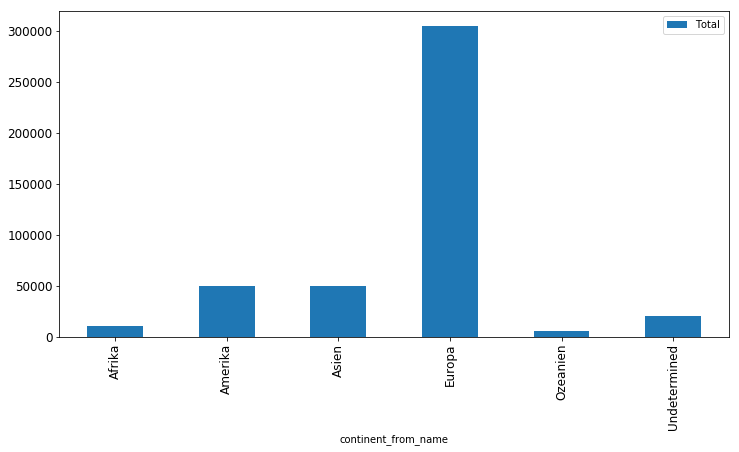

In [58]:
# Bar plot over where forigeners come from

#We do not include Swiss citizen
subcontinent = ZH_in_df[ZH_in_df.country_from_name != 'Schweiz']
subcontinent = df_subset_total(subcontinent, ['continent_from_name'], 'Total')
subcontinent.plot.bar(x='continent_from_name',figsize=(12,6),fontsize=12)

In the bar plot above we notice that most of the incoming people are from Europe and in particular Central Europe. Therefore have we for now devided these into 3 groups: Swiss, European and Non-European.

In [59]:
# This is a function that given the year, y, and the nationality (Swiss, European or Non-European), returns a dataframe
# with ratio of people moving into the diffrent district compared to how many already lives there for the respective
# year and nationality.

def year(y,nationality):
    # Creats a dataframe of ZH_in_df where only the rows with Year y is kept
    ZH_in_df_year = ZH_in_df[ZH_in_df.Year == y]
    #Rest index of this dataframe
    ZH_popul_year = ZH_popul[ZH_popul.Year == y].reset_index()
    
    ZH_popul_year_total = df_subset_total(ZH_popul_year, ['Year','district_name'], 'Total')
    # Creat a dataframe of the above but this time we only keep the Swiss citizen
    ZH_in_df_swiss = ZH_in_df_year[ZH_in_df_year.country_from_name == 'Schweiz']
    # Creat a datafram with on non swiss citizen
    ZH_in_df_non_swiss = ZH_in_df_year[ZH_in_df_year.country_from_name != 'Schweiz']
    # New dataframe where we save the results of the ratios later, and we only keep the disticts name.
    ZH_in_precentage1 = df_subset_total(ZH_in_df_non_swiss, ['Year','district_to_name'], 'Total')
    
    ZH_in_precentage = ZH_in_precentage1[['district_to_name']]
    # If nationality is Swiss calculate the above explained ratio
    if nationality == 'Swiss':
        
        district_popul_CH_year =  district_popul_CH[district_popul_CH.Year == y]

        district_popul_CH_year_swiss = district_popul_CH_year[district_popul_CH_year.CH_nonCH == 'Swiss'].reset_index()
        
        ZH_in_df_swiss_year = df_subset_total(ZH_in_df_swiss, ['Year','district_to_name'], 'Total')
        
        ZH_in_precentage['Total'] = ZH_in_df_swiss_year['Total']/ZH_popul_year_total['Total']*100
        
        #ZH_in_precentage['Swiss'] = ZH_in_df_swiss_year['Total']/ZH_in_df_swiss_year['Total'].sum()*100
        
    # If nationality is European calculate the above explained ratio         
    elif nationality == 'European':
        
            ZH_in_df_europa = ZH_in_df_non_swiss[ZH_in_df_non_swiss.continent_from_name == 'Europa']
            
            ZH_in_df_europa_year = df_subset_total(ZH_in_df_europa, ['Year','district_to_name'], 'Total')
            
            ZH_in_precentage['Total'] = ZH_in_df_europa_year['Total']/ZH_popul_year_total['Total']*100
            
            #ZH_in_precentage['European'] = ZH_in_df_europa_year['Total']/ZH_in_df_europa_year['Total'].sum()*100
     # If nationality is Non-European calculate the above explained ratio 
    elif nationality == 'Non-European' :
            
            ZH_in_df_world = ZH_in_df_non_swiss[ZH_in_df_non_swiss.continent_from_name != 'Europa']
        
            ZH_in_df_world_year = df_subset_total(ZH_in_df_world, ['Year','district_to_name'], 'Total')
    
            ZH_in_precentage['Total'] = ZH_in_df_world_year['Total']/ZH_popul_year_total['Total']*100
    # If the wrong attributes are called
    else :
        
        return 'Not a valid year or Nationality'
  
    return ZH_in_precentage

In [60]:
#Function that plots the choropleth map, uneven color scale since the data us not evenly distributed.
import folium
from folium import plugins
import branca.colormap as cms
def plotting(y,nationality) :
    data1 = year(y,nationality)
    zurich_geo_path = r'Data/ZH_district_geo.json'
    geo_json_data = json.load(open(zurich_geo_path))
    
    zh_map = folium.Map(location=[47.3769, 8.5417], zoom_start=12,tiles='cartodbpositron')
    
    zh_map.choropleth(geo_data=geo_json_data, data=data1,
             columns=['district_to_name','Total'],
             key_on='feature.properties.qname',
             fill_color='YlGnBu',
             threshold_scale = [0,2,4,6,8,20],
             legend_name='Percentage of ' + nationality + ' moving in compared to district population')

    return zh_map

For our analysis we created several maps with widgets that allow us to change the year and select a subset of the data (here: Swiss vs European vs other foreigners) to be displayed in the map.

Unfortuantely for now this feature is **not available in GitHub or nbviewer**. Until this feature has been updated the notebook has to be run in the kernel in order to render the interactive maps.

The screenshot below is given to provide an example of these maps.

In [61]:
from IPython.display import IFrame
IFrame("Images/Screen_shot_widget.png", width=1000, height=600)


In [62]:
#Interact calls the plotting function with the widget values and plots the new map
interact(plotting, y = widgets.IntSlider(min=1993, max=2016,step=1), 
         nationality = ['Swiss','European','Non-European'] )

A Jupyter Widget

<function __main__.plotting>

From the map we can see that there are a higher percentage of people moving in to the central district compared to have many people are living in the diffrent districts. What to be noticed is that the range in the scale chages over the years, therefore it can be a bit hard to compare the diffrent maps but it still gives a good understanding where the moving ratios are the highets compared to have many are already living in the district. For the next milestone the scale will be the same for all maps.

If we compare the Swiss, European and Non-european the moving patterns are quite similar with only a few differences. It seems like Non-european prefer central Zurich but also the northern district. The swiss as well as the Europeans prefer the center and the closest district.

### A special case: What happened in Escher Wyss (and not just once) <a name="EW"></a>

We have seen earlier that the district Escher Wyss created several exceptional cases. Here we try to take a closer look at various features like overall population, number of foreigners, ratio of single/married people and demographic decomposition.

In [63]:
#df_subset_percent(df, retain_groups, percent_group, total_column)
EW='Escher Wyss'
EW_popul=ZH_popul[ZH_popul['district_name']==EW]

# Annual numbers
EW_age_percent = df_subset_percent(EW_popul, ['Year'], 'age_group5', 'Total')

# Finding the annual percentages for each age group in the overall population

#df_select_values(df, selected_column, value_list):
EW_children_percent =df_select_values(EW_age_percent, "age_group5", ["0-4", "5-9","10-14","15-19"])
EW_children_percent =df_subset_total(EW_children_percent, "Year", "Percent of age_group5").set_index('Year')
EW_children_percent.rename(columns={'Total': 'Children (0-19)'}, inplace=True)

EW_juniorprof_percent =df_select_values(EW_age_percent, "age_group5", ["20-24", "25-29"])
EW_juniorprof_percent =df_subset_total(EW_juniorprof_percent, "Year", "Percent of age_group5").set_index('Year')
EW_juniorprof_percent.rename(columns={'Total': 'Young professionals (20-29)'}, inplace=True)


EW_midlevelprof_percent =df_select_values(EW_age_percent, "age_group5", ["30-34", "35-39", "40-44"])
EW_midlevelprof_percent =df_subset_total(EW_midlevelprof_percent, "Year", "Percent of age_group5").set_index('Year')
EW_midlevelprof_percent.rename(columns={'Total': 'Mid professionals (30-44)'}, inplace=True)

EW_oldprof_percent =df_select_values(EW_age_percent, "age_group5", ["45-49","50-54", "55-59","60-64"])
EW_oldprof_percent =df_subset_total(EW_oldprof_percent, "Year", "Percent of age_group5").set_index('Year')
EW_oldprof_percent.rename(columns={'Total': 'Senior professionals (45-64)'}, inplace=True)

EW_pensioners_percent =df_select_values(EW_age_percent, "age_group5", 
                                                ["65-69","70-74","75-79","80-84","85-89","90-94","95-99","99+"])
EW_pensioners_percent =df_subset_total(EW_pensioners_percent, "Year", "Percent of age_group5").set_index('Year')
EW_pensioners_percent.rename(columns={'Total': 'Pensioners (65+)'}, inplace=True)

# Join the three dataframes and plot them in one graph
EW_generations = pd.concat([EW_children_percent, 
                                  EW_juniorprof_percent, 
                                  EW_midlevelprof_percent, 
                                  EW_oldprof_percent, 
                                  EW_pensioners_percent], 
                                 axis=1 )


In [64]:
# Total population
district_popul_EW = df_select_values(district_popul, 'district_name', ['Escher Wyss'])
popul_EW=district_popul_EW.pivot(values='Total', index='Year',columns='district_name')

# CH and Foreigners 
#Totals - create two each with index year and a single column 'Swiss' resp. 'Foreigners'
CH_total_EW=ZH_district_CH_total[ZH_district_CH_total['district_name'] == 'Escher Wyss'].set_index('Year')
CH_total_EW.rename(columns={'Total': 'Swiss'}, inplace=True)
CH_total_EW.drop(['district_name', 'CH_nonCH'], inplace=True, axis=1)

Foreign_total_EW=ZH_district_Foreign_total[ZH_district_Foreign_total['district_name'] == 'Escher Wyss'].set_index('Year')
Foreign_total_EW.rename(columns={'Total': 'Foreigners'}, inplace=True)
Foreign_total_EW.drop(['district_name', 'CH_nonCH'], inplace=True, axis=1)
# join both df along the index creating two columns
EW_CHnonCH_total = pd.concat([CH_total_EW, Foreign_total_EW], axis=1 )
#Percentages
ZH_CH_percent_EW=ZH_district_CH_percent[ZH_district_CH_percent.district_name == 'Escher Wyss']
CH_percent_EW=ZH_CH_percent_EW.pivot(values='Percent of CH_nonCH', index='Year',columns='district_name')
ZH_Foreign_percent_EW=ZH_district_Foreign_percent[ZH_district_Foreign_percent.district_name == 'Escher Wyss']
Foreign_percent_EW=ZH_Foreign_percent_EW.pivot(values='Percent of CH_nonCH', index='Year',columns='district_name')

# Marital status of new residents
EW_in_df = ZH_within_df[ZH_within_df['district_to_name']=='Escher Wyss']
EW_in_MS_percent = df_subset_percent(EW_in_df, 'Year', 'marital_status', 'Total')
EW_in_MS_percent = EW_in_MS_percent[(EW_in_MS_percent['marital_status']=='Single')|(EW_in_MS_percent['marital_status']=='Married')]
MS_EW = EW_in_MS_percent.pivot(values='Percent of marital_status', index='Year',columns='marital_status')

# Gender among single new residents
EW_in_MS_df = EW_in_df[EW_in_df['marital_status']=='Single']
EW_in_single_gender_percent = df_subset_percent(EW_in_df, 'Year', 'gender', 'Total')
#EW_in_gender_percent = EW_in_gender_percent[(EW_in_gender_percent['marital_status']=='M')|(EW_in_gender_percent['female']=='F')]
single_gender_EW = EW_in_single_gender_percent.pivot(values='Percent of gender', index='Year',columns='gender')

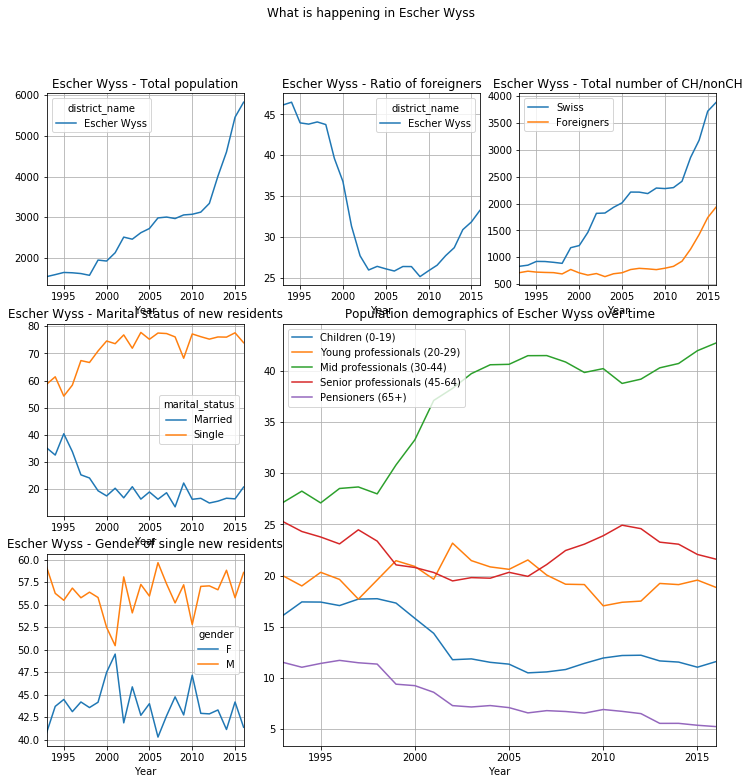

In [65]:
from matplotlib.gridspec import GridSpec

# Set up size of figure
fig = plt.figure(figsize=(12,12))
#Set up grid
gs = GridSpec(3,3)
# Define the subplots: [a,b] is just a cell, [a:c, b:d] is a block
ax1 = plt.subplot(gs[0, 0])
ax2 = plt.subplot(gs[0, 1])
ax3 = plt.subplot(gs[0, 2])
ax4 = plt.subplot(gs[1, 0])
ax5 = plt.subplot(gs[1:, -2:])
ax6 = plt.subplot(gs[-1, 0])

fig.suptitle("What is happening in Escher Wyss")

popul_EW.plot.line(title='Escher Wyss - Total population', grid=True, ax=ax1)
Foreign_percent_EW.plot.line(title='Escher Wyss - Ratio of foreigners', grid=True, ax=ax2)
EW_CHnonCH_total.plot.line(title='Escher Wyss - Total number of CH/nonCH', grid=True, ax=ax3)
# Foreign_total_EW.plot.line(title='Escher Wyss - Total number of foreigners', label='Foreigners', grid=True, ax=ax3)
# CH_total_EW.plot.line(title='Escher Wyss - Total number of foreigners', label='Swiss', grid=True, ax=ax3)
MS_EW.plot.line( title='Escher Wyss - Marital status of new residents', grid=True, ax=ax4)
single_gender_EW.plot.line( title='Escher Wyss - Gender of single new residents', grid=True, ax=ax6)
my_plot_title="Population demographics of "+EW+" over time"
EW_generations.plot.line(title=my_plot_title, grid=True, ax=ax5 )

plt.show()


**Observation:** 

We can clearly see that the population grew in two phases: i) 1998 to 2006, and ii) 2012-2016. The population doubled each time, but in different ways. 

The first was mostly driven by Swiss nationals, single between 30 and 44 years old. Note that the number of foreigners, children (families) or pensioners did not decline in this period, i.e. they were not replaced or driven out by the new arrivals.

In contrast, the second phase was more heterogeneous in terms of generations and nationalities. Nevertheless, Escher Wyss still does not appear very attractive to families and couples.

**Explanation:** 

Escher Wyss was redeveloped in two phases in the 90s and late 00s, adding new living space and offices for tech-oriented companies and attracting new residents.



# The Storyline - Life in Zurich <a name="Storyline"></a>

### The idea 
In 1993, you are just 18, you move to Zurich. Your plan for the next 25 years is:

1) Study/work in Zurich,  2) get married at the age of 26,   3) have children at the age of 30.

How do these decisions influence where you will live, when you will move or even leave Zurich? 

## A single  storyline

Our simulation is more general by allowing you to specify personal information (PI) and your lifeplan. It then creates a path according to these. 

#### Initial personal information

To start your storyline you specify the year you move to Zurich, your age, gender and matital status at the time.

#### Your lifeplan
You also decide on some key parameters on your life: 

1) **married_age: When are you getting married?** - At this point your marital status is changed. Your moving pattern will differ from that of singles.

2) **family_age: When are you getting a family?** - When you have children they influence your decisions. However the original data does not record whether people have children or not. In order to distinguish between your family and a couple (or single) without children, we don't track you but instead your child. The gender of your child is generated probabilistically. We change age and gender to those of the your child and set the marital status to 'Single'. Once your child is 18, we return to your parameters.

3) **minimum_years: What is the minimum time that you plan to live in Zurich?** - This function allows us to generate some interesting path by limiting the chances that you will leave Zurich too soon. (Chances for leaving are actually high.)


Remark: Data does not distinguish whether people have children or not. Therefore we track a family through the children until they are 18 and assumed to leave the house.

### Developing the storyline

In order to track your history we use your YAGMD values (Y=year, A=age group (10yr), G=gender, M=marital status, D=current district). The simulations subsets the dataframe according to the current PI and makes a probabilisitc decision based on this subgroup. 

Below we list the steps and the functions we use to create the storyline.

**generate_storyline** is the main function. It takes as input: your personal information (YAGMD), your lifeplan (married_age, family_age, minimum_years) and the option to record detailed information in my_records.


Step 1: Generate the initial district with **create_init_param** and update my_records

Every year

Step 2: Update YAGMD by comparing the YAGMD generated in the previous year with the lifeplan.

When age==married_age, set marital_status=married.

When age==family_age , set age=0 and marital_status=single. We randomly generate the gender of your child. 
When age reaches 18 we set age back to your current age and continue tracking you.

Step 3: Create next year's YAGMD (**next_year**)

Using **decision** we decide probalistically whether you move within Zurich, leave Zurich or stay. If your lifeplan does not yet allow you to consider leaving Zurich then your decision is automatically to stay.

If you decided to move within Zurich, then we generate the new district (**ZH_within_district_gen**)

Step 4: Update the record with the statuses, decisions and the districts in which you live (if record==True) or the final district (record==False).



## (Almost) 1001 storylines

In a second step we run a 1000 storylines and collect the final district where you would live in 2017 (record=False). 

We consider two scenarios:

**a)** A young woman moves to Zurich for her undergraduate studies, finds a job, falls in love, marries and has a family. 

Initial parameters: (Year=1993, age=18, gender='F', marital status='Single', married_age=26, family_age=30, minimum_years=13)

**b)** A couple moves to Zurich to start a family.

Initial parameters: (Year=1993, age=29, gender='M', marital status='Married', married_age=26, family_age=30, minimum_years=10)

We then compare the final district of both scenarios in a table and plot the differences.

### Functions used for the storyline

#### Help functions

Help functions to generate age group codes and to subset dataframes according to specific parameter choices. 
These are given below:

In [66]:
# Turn age into the correct age_group_code 

def age_gp_code(age):
    age_group_code=math.floor((age/10)+1)
    return age_group_code


#-------------------------------------------------------------------------------------------------------------
# Functions that automate selecting specific subsets from the dataframe:
# Subset on AGM
def df_subset_AGM(df, Age_group_code, Gender, Marital_status):
    df = df[df['age_group_code']==Age_group_code]
    df = df[df['gender']==Gender]
    df = df[df['marital_status']==Marital_status]
    output = df
    return output;


#-------------------------------------------------------------------------------------------------------------
# Subset on YAG
def df_subset_YAG(df, Year, Age_group_code, Gender):
    df = df[df['age_group_code']==Age_group_code]
    df = df[df['gender']==Gender]
    df = df[df['Year']==Year]
    output = df
    return output;


#-------------------------------------------------------------------------------------------------------------
# Subset on YAG using 5 year bins for age (needed for population dataframe)
def df_subset_YA5G(df, Year, Age_group_code, Gender):
    df = df[df['age_group5_code']==Age_group_code]
    df = df[df['gender']==Gender]
    df = df[df['Year']==Year]
    output = df
    return output;


#-------------------------------------------------------------------------------------------------------------
# Subset on YAGM
def df_subset_YAGM(df, Year, Age_group_code, Gender, Marital_status):
    df=df_subset_YAG(df, Year, Age_group_code, Gender)
    df = df[df['marital_status']==Marital_status]
    output = df
    return output;


#-------------------------------------------------------------------------------------------------------------
# Subset on YAGD
def df_subset_YAGD(df, Year, Age_group_code, Gender, District):
    df=df_subset_YAG(df, Year, Age_group_code, Gender)
    df = df[df['district_from_name']==District]
    output = df
    return output;



### Main functions

**create_init_param(user_YAGMD)**: takes the start values for YAGMD provided by the user and creates the initial parameters needed for the simulation

In [67]:
# Convert start parameters into initial parameters
def create_init_param(user_YAGMD):
    (start_year, start_age, start_gender, start_marital_status, start_district) = user_YAGMD
    global child_status
    global leave_option

### Age
    age=start_age
### Marriage
    marital_status = start_marital_status
    if married_age<= start_age:
        marital_status = 'Married' # we override your input of being single and treat you as married
    # print('We assume that when you move to Zurich you are already married')

### Family / Children
    gender = start_gender
# Considering the case that you move with a family/child to ZH
    if family_age<=start_age: # equality means child just born and age=0
        # print('When you move to Zurich you are already had a family and a child')
        child_status = True
        # Calculate age of the child
        age=start_age-family_age
        # Change gender to be tracked by that of the child
        gender = gender_child
    init_param = (start_year, age, gender, marital_status, start_district)
    return init_param



#### The first move

As you move to Zurich you have to decide where to move to. 

**ZH_in_district_gen(YAGMD)**: use the values from **create_init_param(user_YAGMD)** to generate the first district you live in

In [68]:
# Probabilistic district generators:
# Below dataframes will be subset according to the YAGMD parameters

def ZH_in_district_gen(YAGMD):
    (year, age, gender, marital_status,district)=YAGMD
    # Calculate age_code first
    age_group_code = age_gp_code(age)
    ZH_in_YAGM=df_subset_YAGM(ZH_in_df, year, age_group_code, gender, marital_status)
    # Create total count for each district with YAGM
    ZH_in_YAGM_district_total=df_subset_total(ZH_in_YAGM, 'district_to_name', 'Total')
    # Create ZH total count with YAGM - one number
    ZH_in_YAGM_count=ZH_in_YAGM_district_total.agg({'Total': 'sum'})
    # Create district vector
    district_list=ZH_in_YAGM_district_total['district_to_name']
    # Create probabilities (percentages) for each district with YAGM
    # need to deal with column being represented as a series for division (use for loop) 
    # and want quotients returned as single floats not lists or tuples
    probability_list=[float(x/ZH_in_YAGM_count) for x in ZH_in_YAGM_district_total['Total']]
    # Generate random choice and transform outcome to a string
    # If we do not use [0] to extract single element from the list, 
    # then use [2:-2] to cut off [' and '] from the string
    newdistrict = str((np.random.choice(district_list, 1, p=probability_list) )[0])
    next_YAGMD=(year, age, gender, marital_status,newdistrict)
    # print(next_YAGMD)
    return next_YAGMD

While generating the storyling we need to regularly update the PI (YAGMD). 

**update(YAGMD)**: Update latest YAGMD (generated in previous cycle) against our lifeplan then return the updated YAGMD    

In [69]:
# Function: update_YAGMD(YAGMD)
# At the start of each loop we update YAGMD against our lifeplan - remember YAGMD is returned as a tuple 
# Return the updated YAGMD    
    
def update_YAGMD(YAGMD):
    global child_status
    global leave_option
    (year, age, gender, marital_status, district)=YAGMD
    year = year +1 #update year. 
    age = age + 1 # update age
    if age==married_age: # this cannot happen in child setting as age<18
        marital_status='Married'  
    if minimum_years<year-start_year:
        leave_option = True
     
    if age==family_age:
        child_status = True
        age=0 # reset age
        gender=gender_child # reset gender
        marital_status='Single' #Note if married_age==family_age then this overrides 'Married'
    
    # When the child turns 18 (so age=18), reset age and marital_status
    if (age==18 and child_status == True):
        child_status = False
        age=year-start_year+start_age # reset age
        gender=start_gender # reset gender
        if age>=married_age:
            marital_status='Married'
    
    updated_YAGMD=(year, age, gender, marital_status, district)
    return updated_YAGMD
    

Below we define the 3 functions used to make the decision of staying, moving or leaving: 

1) **ZH_popul_YAGD_count(YAGMD)**:  to calculate the number of people living in your current district and fitting your YAGMD-parameter.

2) **ZH_within_YAGD_count(YAGMD)**:  to calculate the number of people living in your current district, fitting your YAGMD-parameter who decided to move withing Zurich.

3) **ZH_out_YAGD_count(YAGMD)**:  to calculate the number of people living in your current district, fitting your YAGMD-parameter who decided to leave Zurich.

In [70]:
# Once in ZH we are met with 3 options: 1) stay where we are, 2) moving within ZH, 3) leave ZH
# For the probability distribution we need for year Y
# 1) total number of AGM living in current district, 
# 2) total of AGM moving within ZH from the current district D, 
# 3) total of AGM leaving ZH from the current district D

def ZH_popul_YAGD_count(YAGMD):
    (year, age, gender, marital_status, district)=YAGMD
    age_group_code = age_gp_code(age)
    # Calculate total population in the district for 10yr groups 
    # Ignoring marital status! here - note that it is actually irrelevant while we are tracking children
    age_group5_code1 = age_group_code*2-1
    age_group5_code2 = age_group_code*2
    # We create a frame for each subgroup and then take the total numbers
    ZH_popul_YAG1 = df_subset_YA5G(ZH_popul, year, age_group5_code1, gender)
    ZH_popul_YAGD1 = ZH_popul_YAG1[ZH_popul_YAG1['district_name']==district]
    ZH_popul_YAGD1_count = ZH_popul_YAGD1.agg({'Total': 'sum'})
    #
    ZH_popul_YAG2 = df_subset_YA5G(ZH_popul, year, age_group5_code2, gender)
    ZH_popul_YAGD2 = ZH_popul_YAG2[ZH_popul_YAG2['district_name']==district]
    ZH_popul_YAGD2_count = ZH_popul_YAGD2.agg({'Total': 'sum'})
    # Add totals
    output = ZH_popul_YAGD1_count + ZH_popul_YAGD2_count
    return output


#-------------------------------------------------------------------------------------------------------------
def ZH_within_YAGD_count(YAGMD):
    (year, age, gender, marital_status, district)=YAGMD
    age_group_code = age_gp_code(age)
    # Calculate the total number of YAG moving away from a district (ignoring marital status)
    # Extract subset dataframe
    ZH_within_YAG=df_subset_YAG(ZH_within_df, year, age_group_code, gender)
    # Create total count for each district with YAG
    ZH_within_YAG_district_total=df_subset_total(ZH_within_YAG, 'district_from_name', 'Total')
    # Select YAG total for given district
    output_row=ZH_within_YAG_district_total[ZH_within_YAG_district_total['district_from_name']==district]
    output=output_row['Total']
    if len(output)==0:
        #print(output,'empty within')
        output= pd.Series([0])
    return output


#-------------------------------------------------------------------------------------------------------------
def ZH_out_YAGD_count(YAGMD):
    (year, age, gender, marital_status, district)=YAGMD
    age_group_code = age_gp_code(age)
    # Calculate the total number of YAG moving away from a district (ignoring marital status)
    # Extract subset dataframe
    ZH_out_YAG=df_subset_YAG(ZH_out_df, year, age_group_code, gender)
    # Create total count for each district with YAG
    ZH_out_YAG_district_total=df_subset_total(ZH_out_YAG, 'district_from_name', 'Total')
    # Select YAG total for given district
    output_row=ZH_out_YAG_district_total[ZH_out_YAG_district_total['district_from_name']==district]
    output=output_row['Total']
    if len(output)==0:
        #print(output,'empty out')
        output= pd.Series([0])
    return output

#### Decision function:

When you live in Zurich you have to decide whether to a) stay in your place, b) move inside Zurich or c) leave Zurich altogether. 

We do this by generating a probability distribution that compares the number of people fitting the YAGMD-parameter and decided on a), b) or c). From this probability distribution we generate the decision.

Since the population data for Zurich does not track the marital status of people we can not use this parameter to subset the population. Hence we ignore the marital status and only use YAGD for subsetting.

**decision(YAGMD)**:  to generate a random choice from a), b) or c) according to the numbers calculated by functions in the section above 1), 2) and 3).

In [71]:
def decision(YAGMD):
    if YAGMD[4]=='outside':
        #return 'You left ZH, remember!?!'
        return 'leave'
    elif YAGMD[4]=='None':
        return 'You first have to move into ZH'
    else:
        option_list=['stay', 'move within', 'leave']
        overall=int(ZH_popul_YAGD_count(YAGMD))
        move_within = int(ZH_within_YAGD_count(YAGMD))
        leavers = int(ZH_out_YAGD_count(YAGMD))
        
        #Problem1: For certain subsets and districts there is a zero subset matching YAGMD.
        # Set overall from 0 to 1. This avoids potential division by zero.
        if overall==0:
            overall=1
            print('Warning: overall population matching the YAGMD=0:, ', overall,'move_within=', move_within, 'leavers=', leavers)
            print(YAGMD)
        
        #Problem2: For certain subsets and districts there is such a high turnover that combined
        # we have more movers and leavers than the overall population. As a result the number of people staying
        # would be negative and as a result so would be the probabilities we wish to use. ---> Error 
        # Warning call
        # if move_within+leavers>=overall:
            # print('Warning: for ',YAGMD, '  ',overall,' < ', move_within, ' or ', leavers,', staying ', overall- move_within -leavers)
        
        # The above problem may arise because people only spend a few months and thus do not get counted as 
        # residents in the population, but contribute to movers and leavers.
        # To counteract this we treat the population as stayers.
        # This is an adhoc solution, to avoid throwing up an error on the probabilities
        # and to avoid an unreasonably low chance of staying in the district.
        if (move_within + leavers)/overall > 0.8: # i.e. if sum makes up over 80% of overall
            #print('take evasive action')
            staying = overall
            # redefine the overall value
            overall = staying + move_within + leavers
        else:
            # Uncomment section below if we want to use leave_option 
            # to avoid leavers influencing the probability distribution for the random choice
            if leave_option == False:
                # The above prevents us from leaving, hence we only decide between moving and staying
                overall=overall-leavers #positive as leavers<overall
                leavers=0
            staying = overall- move_within -leavers #positive as movers+leavers<overall

        decision_list=[staying , move_within, leavers]
        probability_list=[float(x/overall) for x in decision_list]

        # Test loop 1 and error tracing:
        for n in range(0,3):
            if probability_list[n]<0:
                print('Problem: negative probability', probability_list)
                print(probability_list, overall, move_within, leavers, YAGMD)
        
        # Rounding errors lead to the problem that the 
        if probability_list[0]+probability_list[1]+probability_list[2] !=1:
            # print('correcting overall prob sum', probability_list)
            probability_list[2]=1-probability_list[0]-probability_list[1]
            # print('Corrected version:', probability_list)
        
        # Note we get single element list, so extract with [0]
        # get numpy.str so use str to make sure we have str(ing)
        decision = str((np.random.choice(option_list, 1, p=probability_list) )[0])
        # For debugging and testing we return probability_list 
        return decision
    

**ZH_within_district_gen(YAGMD):** given your YAGMD work out the frequency of district_to_name and create a probability distribution from it. Randomly select the next district.

In [72]:
def ZH_within_district_gen(YAGMD):
    (year, age, gender, marital_status, district)=YAGMD
    # calculate age_code first
    age_group_code = age_gp_code(age)
    ZH_within_YAGM=df_subset_YAGM(ZH_within_df, year, age_group_code, gender, marital_status)
    # Create total count for each district with YAGM
    ZH_within_YAGM_district_total=df_subset_total(ZH_within_YAGM, 'district_to_name', 'Total')
    # Create ZH total count with YAGM - one number
    ZH_within_YAGM_count=ZH_within_YAGM_district_total.agg({'Total': 'sum'})
    #print((ZH_within_YAGM_count))
    # Create district vector
    district_vect=ZH_within_YAGM_district_total['district_to_name']
    # Create probabilities (percentages) for each district with YAGM
    # need to deal with column being represented as a series for division (use for loop) 
    # and want quotients returned as single floats not lists or tuples
    probability_vect=[float(x/ZH_within_YAGM_count) for x in ZH_within_YAGM_district_total['Total']]
    #print(probability_vect)
    # Generate random choice and transform outcome to a string
    newdistrict = str(np.random.choice(district_vect, 1, p=probability_vect) )
    # newdistrict is return with square barckets and quotation marks which we need to cut off
    newdistrict=newdistrict[2:-2]
    newYAGMD=(year, age, gender, marital_status, newdistrict)
    return newYAGMD

Once the decision has been made we need to act upon it and create the new YAGMD

**next_year(YAGMD)**: Given the decision(YAGMD), check whether it fits our plan then
act upon the decision and create next_YAGMD . 

If we have not passed the minimum number of years we override the decision to leave.

In [73]:
#Function: next_year(YAGMD)
# Create the YAGMD for next year as follows:
# Decide whether to move, leave or not using the decision(YAGMD) function
# Act upon the decision and create next_YAGMD with the outcome accordingly

def next_year(YAGMD):
    global initial_decision
    global current_decision

    initial_decision = decision(YAGMD)
    
    if initial_decision == 'move within': 
        next_YAGMD=ZH_within_district_gen(YAGMD)
        next_district=next_YAGMD[4]
        current_decision = 'move within'
        
    elif initial_decision == 'leave':
        # Check that minimum years have passed yet, i.e. that leave_option = True 
        if leave_option == False:
        #Option 1: You have that leaving feeling but you cannot leave yet, so you decide to move within ZH :
#             next_YAGMD=ZH_within_district_gen(YAGMD)
#             next_district=next_YAGMD[4]
#             YAGMD=next_YAGMD
#             current_decision = 'move within'
        #Option 2: You suck it up and you stay where you are:
            next_district = YAGMD[4]
            current_decision = 'must stay'
        if leave_option == True:
            current_decision = 'leave'
            next_district= 'outside'
        # YAGMD is a tuple, so convert to list, amend and reconvert to tuple
        YAGMD_list=list(YAGMD)
        YAGMD_list[4]=next_district
        next_YAGMD=tuple(YAGMD_list)
        
    else: 
        #case of decision =stay:
        current_decision = 'stay'
        #keep YAGMD aka do nothing
        next_YAGMD=YAGMD
        next_district = YAGMD[4]
    
    return next_YAGMD

#### Main function to generate the storyline

In [74]:
# When record=False then only the final district is recorded
# When record=True then we record each years YAGMD plus the decisions

def generate_storyline(user_start_year, 
                       user_start_age, 
                       user_start_gender, 
                       user_start_marital_status, 
                       #start_district, #would allow to start in a ZH district instead of coming from outside.
                       user_married_age, 
                       user_family_age, 
                       user_minimum_years,
                       record):
    global child_status
    global leave_option
    global married_age
    global family_age
    global minimum_years
    global start_year
    global start_age 
    global start_gender
    global start_marital_status
    global gender_child
    # Defining further parameters
    start_year = user_start_year
    start_age = user_start_age
    start_gender = user_start_gender
    start_marital_status = user_start_marital_status
    married_age = user_married_age
    family_age = user_family_age
    minimum_years = user_minimum_years
    
    start_district = 'None'
    user_YAGMD=(start_year, start_age, start_gender, start_marital_status, start_district)
    life_plan = (married_age, family_age, minimum_years)
    ### Child
    # For simplicity we work with the assumption that you have one child.
    # child_status indicates that you have a child under 18. 
    # When child_status=False we track you, the parent. 
    # When child_option=True we track your child.
    # Initial assumption you have no child yet - if otherwise this gets updated later
    child_status = False
    # Generating the gender of your child randomly
    gender_child = str((np.random.choice(['M','F'], 1, p=[0.5,0.5]) )[0])
#     print('start_gender', start_gender,'    ', 'gender_child', gender_child)
    
    ### Minimum stay and leave_option
    # leave_option checks whether the minimum years for staying in ZH have passed. 
    # When leave_option=True then you can consider leaving, when leave_option=False you cannot leave ZH. 
    # Initialize leave_option 
    leave_option = True
    if minimum_years>0:
        leave_option = False

    # Record keeping
    # Create lists to track outputs, statuses, decisions and the districts in which you live.
    # Initialise list of records
    my_records=list()

    # Create the initial parameters for the storyline
    init_param = create_init_param(user_YAGMD)
    
    # Moving into Zurich - generating the first district in which you live
    YAGMD=ZH_in_district_gen(init_param)
    
    # Update records
    if record==True:
        # Create initial record
        YAGMD_list=list(YAGMD)
        first_record=list(['move to ZH', 'move to ZH'])
        first_record.extend(YAGMD_list)
        first_record.extend([leave_option, child_status] )
        my_records=[first_record]
    #endif

    #Generate timeline
    for y in range(YAGMD[0]+1,2017): 
        # Note y is used inside update_YAGMD(YAGMD) as the current year
        # At the start of each loop we update YAGMD against our lifeplan - remember YAGMD is returned as a tuple 
        updated_YAGMD=update_YAGMD(YAGMD)
        
        # Create the YAGMD for next year as follows:
        # This includes the decision whether to move, leave or not; acting upon the decision 
        # and creating next_YAGMD with the outcome accordingly
        YAGMD = next_year(updated_YAGMD)
        

        # Update my_records
        if record==True:
            # Build new record
            YAGMD_list=list(YAGMD)
            new_record=list([initial_decision, current_decision])
            # print(new_record)
            new_record.extend(YAGMD_list)
            new_record.extend([leave_option, child_status] )
            my_records.append(new_record)
        
        if record==False and y==2016:
            YAGMD_list=list(YAGMD)
            final_district=YAGMD_list[4]
            my_records=[final_district]
    #end of loop
    
    return my_records

### Generating a single storyline <a name="1SL"></a>

In [75]:
# Reload data frames
ZH_in_df = pd.read_csv('Data/ZH_in.csv')
ZH_within_df = pd.read_csv('Data/ZH_within.csv')
ZH_out_df = pd.read_csv('Data/ZH_out.csv')
ZH_popul = pd.read_csv('Data/ZH_popul.csv')

In [76]:
# For a storyline set record to True (get detailed annual info)
my_records = generate_storyline(1993, 18, 'F', 'Single', 26, 30, 13, True)

storyline = pd.DataFrame(my_records, columns=['initial decision', 'final decision', 
                                              'year', 'age', 'gender', 'marital_status', 'district', 
                                              'leave_option', 'child_status'])

#Save some storylines in files so that we can use them later 
storyline.to_csv('Storylines/samplestoryline.csv', encoding='utf-8', index = False)

storyline

,initial decision,final decision,year,age,gender,marital_status,district,leave_option,child_status
0,move to ZH,move to ZH,1993,18,F,Single,Altstetten,False,False
1,stay,stay,1994,19,F,Single,Altstetten,False,False
2,stay,stay,1995,20,F,Single,Altstetten,False,False
3,stay,stay,1996,21,F,Single,Altstetten,False,False
4,stay,stay,1997,22,F,Single,Altstetten,False,False
5,move within,move within,1998,23,F,Single,Unterstrass,False,False
6,stay,stay,1999,24,F,Single,Unterstrass,False,False
7,stay,stay,2000,25,F,Single,Unterstrass,False,False
8,move within,move within,2001,26,F,Married,Altstetten,False,False
9,stay,stay,2002,27,F,Married,Altstetten,False,False


In [77]:
samplestoryline=pd.read_csv('Storylines/samplestoryline2a.csv')
samplestoryline

,initial decision,final decision,year,age,gender,marital_status,district,leave_option,child_status
0,move to ZH,move to ZH,1993,18,F,Single,Hottingen,False,False
1,stay,stay,1994,19,F,Single,Hottingen,False,False
2,move within,move within,1995,20,F,Single,City,False,False
3,stay,stay,1996,21,F,Single,City,False,False
4,move within,move within,1997,22,F,Single,Albisrieden,False,False
5,move within,move within,1998,23,F,Single,Affoltern,False,False
6,stay,stay,1999,24,F,Single,Affoltern,False,False
7,stay,stay,2000,25,F,Single,Affoltern,False,False
8,stay,stay,2001,26,F,Married,Affoltern,False,False
9,stay,stay,2002,27,F,Married,Affoltern,False,False


In [78]:
# Defining color palettes
# Single colour
def sample_storyline_color_mono(district):
    if district in sample_districts:
        return '#ff0000'
    else:
        return '#ffffff'

#sample_districts=['Hottingen', 'City', 'Albisrieden', 'Affoltern', 'Sihlfeld', 'Alt-Wiedikon']

# Different colours
def sample_storyline_color_gradual(district):
    if district == 'Hottingen':
        return '#ff6600'
    if district == 'City':        
        return '#ffff00'
    if district == 'Albisrieden':
        return '#59ff00'
    if district == 'Affoltern':
        return '#00ffff'
    if district == 'Sihlfeld':
        return '#005dff'
    if district == 'Alt-Wiedikon':
        return '#b200ff'
    else:
        return '#ffffff'

# Plotting the map
zurich_geo_path = r'Data/ZH_district_geo.json'
geo_json_data = json.load(open(zurich_geo_path))
storyline_map = folium.Map(location=[47.3769, 8.5417], zoom_start=12,tiles='cartodbpositron')
folium.GeoJson(
    geo_json_data,
    style_function=lambda feature: {
        'fillColor': sample_storyline_color_gradual(feature['properties']['qname']),
        'color' : 'black',
        'weight' : 2,
        }
    ).add_to(storyline_map)
storyline_map

### Generating (almost) 1001 storylines <a name="1000SL"></a>

Since the iterations were calculation intensify we have run them once and saved the output externally. The code ahs been commented out and the data has been read from the external files.

** Scenario a)** A young woman moves to Zurich for her undergraduate studies, finds a job, falls in love, marries and has a family. 

Initial parameters: (Year=1993, age=18, gender='F', marital status='Single', married_age=26, family_age=30, minimum_years=13)

In [79]:
# # For an iteration set record to False (only get final disrict)
# iteration_list=list()
# for n in range(0,1001):
#     # Version a)
#     my_records = generate_storyline(1993, 18, 'F', 'Single', 26, 30, 13, False)
#     iteration_list.append(my_records)
# #     if n%20==0:
# #         print(n)

# final_district_1000a = pd.DataFrame(iteration_list, columns=['last district'])
# final_district_1000a.to_csv('Storylines/storyline_iteration_1000a.csv', encoding='utf-8', index = False)

# final_district_1000a.describe()

** Scenario b)** A couple moves to Zurich to start a family.

Initial parameters: (Year=1993, age=29, gender='M', marital status='Married', married_age=26, family_age=30, minimum_years=10)

In [80]:
# # For an iteration set record to False (only get final disrict)
# iteration_list=list()
# for n in range(0,1000):
#     # Version b)
#     my_records = generate_storyline(1994, 30, 'M', 'Married', 26, 31, 10, False)
#     iteration_list.append(my_records)

# final_district_1000b = pd.DataFrame(iteration_list, columns=['last district'])
# final_district_1000b.to_csv('Storylines/storyline_iteration_1000b.csv', encoding='utf-8', index = False)

# final_district_1000b.describe()

#### Comparing the outcomes for the two scenarios

In [81]:
final_district_1000a=pd.read_csv('storyline_iteration_1000a.csv')
final_district_1000a=final_district_1000a.rename(columns={"last district" : 'Scenario_A'})
Scenario_a=final_district_1000a.apply(pd.value_counts).fillna(0)

final_district_1000b=pd.read_csv('storyline_iteration_1000b.csv')
final_district_1000b=final_district_1000b.rename(columns={'last district' : 'Scenario_B'})
Scenario_b=final_district_1000b.apply(pd.value_counts).fillna(0)


In [82]:
Comparison=Scenario_a.join(Scenario_b)
Comparison['Difference']=Comparison['Scenario_A']-Comparison['Scenario_B']
Comparison=Comparison.reset_index()
Comparison.rename(columns={'index': 'district'}, inplace=True)

# Dropping the row for moving outside of Zurich
Comparison=Comparison.drop([0])
Comparison

,district,Scenario_A,Scenario_B,Difference
1,Affoltern,57,43,14
2,Altstetten,55,41,14
3,Seebach,37,44,-7
4,Friesenberg,33,27,6
5,Albisrieden,30,24,6
6,Hirzenbach,23,30,-7
7,Höngg,20,38,-18
8,Unterstrass,20,33,-13
9,Saatlen,18,18,0
10,Schwamendingen-Mitte,18,13,5


In [83]:
# Add rows for missing districts
missing_rows = [['City',0,0,0],['Hochschulen',0,0,0],['Lindenhof',0,0,0]]
N=len(Comparison) # Note len(Comparison) did not get updated within the for loop, hence we introduce a counter N
for row in missing_rows:
    N=N+1
    Comparison.loc[N] = row
Comparison

,district,Scenario_A,Scenario_B,Difference
1,Affoltern,57,43,14
2,Altstetten,55,41,14
3,Seebach,37,44,-7
4,Friesenberg,33,27,6
5,Albisrieden,30,24,6
6,Hirzenbach,23,30,-7
7,Höngg,20,38,-18
8,Unterstrass,20,33,-13
9,Saatlen,18,18,0
10,Schwamendingen-Mitte,18,13,5


In [84]:
zurich_geo_path = r'Data/ZH_district_geo.json'
geo_json_data = json.load(open(zurich_geo_path))
Scenario_A_map = folium.Map(location=[47.3769, 8.5417], zoom_start=12,tiles='cartodbpositron')
    
Scenario_A_map.choropleth(geo_data=geo_json_data, data=Comparison,
                          columns=['district',"Scenario_A"],
                          key_on='feature.properties.qname',
                          fill_color='YlOrRd',
                          threshold_scale = [0,10,20,30,40,60],
                          #threshold_scale2 = [0,8,16,24,32,40],
                          #threshold_scale3 = [0,12,24,36,48,60],
                          legend_name='Scenario A - Most popular district in 2016'
                         )
#     folium.LayerControl().add_to(zh_map)
# display the content on function call
display(Scenario_A_map)

In [85]:
zurich_geo_path = r'Data/ZH_district_geo.json'
geo_json_data = json.load(open(zurich_geo_path))
Scenario_B_map = folium.Map(location=[47.3769, 8.5417], zoom_start=12,tiles='cartodbpositron')
    
Scenario_B_map.choropleth(geo_data=geo_json_data, data=Comparison,
                          columns=['district',"Scenario_B"],
                          key_on='feature.properties.qname',
                          fill_color='YlOrRd',
                          threshold_scale = [0,10,20,30,40,60],
                          #threshold_scale2 = [0,8,16,24,32,40],
                          #threshold_scale3 = [0,12,24,36,48,60],
                          legend_name='Scenario B - Most popular district in 2016'
                         )
#     folium.LayerControl().add_to(zh_map)
# display the content on function call
display(Scenario_B_map)

#### Mapping the relative popularity of the final district

Red hues indicate scenario A is more popular while blue hues indicate scenario B is more popular. 

In [86]:
# Define colour palette
def comparison_color(district):
    if district == 'City' or district == 'Hochschulen' or district=='Lindenhof':
        return '#0b0b0c'
    diff = Comparison.loc[Comparison['district'] == district, 'Difference'].values[0]
    if diff <= -7:
        return '#ff0000'
    elif diff <= -3:
        return '#f78080'
    elif diff <3:
        return '#ffffff'
    elif diff <7:
        return '#148be0'
    else:
        return '#011399'

# Plot map
zurich_geo_path = r'Data/ZH_district_geo.json'
geo_json_data = json.load(open(zurich_geo_path))
zh_map = folium.Map(location=[47.3769, 8.5417], zoom_start=12,tiles='cartodbpositron')
folium.GeoJson(
    geo_json_data,
    style_function=lambda feature: {
        'fillColor': comparison_color(feature['properties']['qname']),
        'color' : 'black',
        'weight' : 2,
        }
    ).add_to(zh_map)
zh_map

# District to district (D2D) analysis of people moving within ZH <a name="D2D"></a>

We calculate the total number of moves between pairs of districts and plot these in a grid. Since the total numbers of moves between two districts can range from none to 1000s we use a log scale.

Where we use the district codes, these are automatically ordered by Kreis from inner district to outer. 

In [87]:
# Defining population of each district again
district_popul = df_subset_total(ZH_popul, ['Year', 'district_name'], 'Total')

# Using district names
d2d = df_subset_total(ZH_within_df, ['Year', 'district_from_name', 'district_to_name'], 'Total')
d2d_from = df_subset_total(ZH_within_df, ['Year', 'district_from_name'], 'Total')
d2d_to = df_subset_total(ZH_within_df, ['Year', 'district_to_name'], 'Total')

# Using district codes
# Annual total numbers of people moving from district X to Y
d2dc = df_subset_total(ZH_within_df, ['Year', 'district_from_code', 'district_to_code'], 'Total')
# Annual total numbers of people moving from district X
d2dc_from = df_subset_total(ZH_within_df, ['Year', 'district_from_code'], 'Total')
# Annual total numbers of people moving to district Y
d2dc_to = df_subset_total(ZH_within_df, ['Year', 'district_to_code'], 'Total')

In [88]:
# Function to plot number of d2d moves (uses district_code)        
def d2dc_plot(year):
    d2dc_year = d2dc[d2dc['Year']==year]
    d2dc_year_log = d2dc_year[d2dc_year['Total']!=0]
    d2dc_year_log['log-Total']=np.log10(d2dc_year_log.Total)
    d2dc_year_log=d2dc_year_log.drop(['Total'],1)
    tablec_log = d2dc_year_log.pivot(values='log-Total', index='district_to_code',columns='district_from_code')
    # Replace NaN by 0
    tablec_log.fillna(0)
    
    plt.imshow(tablec_log);
    plt.colorbar()
    plt.xlabel('original district')
    plt.ylabel('destination district')
    plt.title('order of magnitude for d2d movements in '+str(year))
    plt.show();

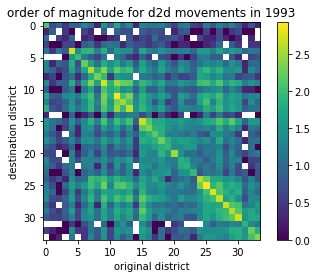

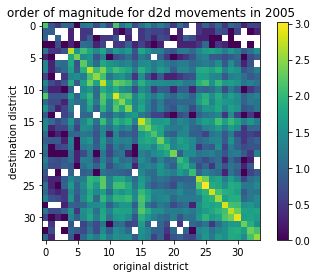

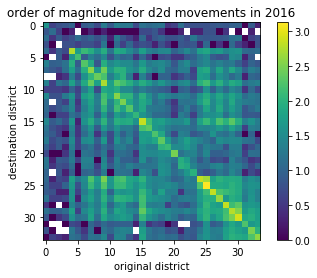

In [89]:
year_selection=[1993, 2005, 2016]
for year in year_selection:
    d2dc_plot(year)


# d2dc_plot(2005)

The diagonal lines highlights that independent of the year, the district size or location, often the majority of moves stays within the same district.

We can clearly see that regardless of size of a district, people most often move within their home district. For Kreis 3 to 6 this effect has diminished over time.

Beyond that moves most often involve Kreis 3 to 6 or 10, 11 and 12.

We also see that for some of the smaller districts, there are no moves to certain districts in some of the years (white boxes) 




## D2same analysis - popularity of districts amongst people living their already

Following our discovery above, we calculate the percentage of people who move within the same district each year and compare these for different districts.

We could interpret this percentage as a popularity or perceived suitability of the district by its residents. Note that suitability may be the result of positive factors like good public transport connections and amenities or proximity to work, as well as negative factors like the rents in other districts being unaffordable.

Where we use the district codes, these are automatically ordered by Kreis from inner district to outer. 

In [90]:
# district population 
district_popul.set_index(['Year', 'district_name'], inplace=True)

# number of people moving within their own district
d2same = d2d[d2d['district_from_name']==d2d['district_to_name']]
d2same.drop(['district_to_name'], axis = 1, inplace = True)
d2same.rename(columns={'district_from_name':'district_name'}, inplace=True)
d2same.set_index(['Year', 'district_name'], inplace=True)

# precentage of people moving within their own district
d2same_percent = d2same/district_popul*100
d2same_percent.rename(columns={'Total':'Percent'}, inplace=True)
d2same_percent=d2same_percent.reset_index()


Percentage of the number of moves from a district to itself (x-axis) in each year from 1993 (top) to 2016 (bottom)


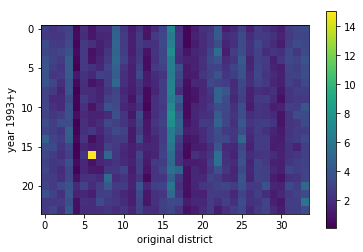

In [91]:
table_self_percent = d2same_percent.pivot(values='Percent', index='Year', columns='district_name')
# Replace NaN by 0
table_self_percent.fillna(0)

plt.imshow(table_self_percent);
plt.colorbar()
plt.xlabel('original district')
plt.ylabel('year 1993+y')
#plt.title('order of magnitude for d2d movements')
print('Percentage of the number of moves from a district to itself (x-axis) in each year from 1993 (top) to 2016 (bottom)')

plt.show();


In the above diagram districts are listed alphabetically and are represented by columns. 

Accordingly, Langstrasse (column no.16) is consistently viewed as very suitable.

In contrast, City (no. 4) and Lindenhof (no. 18), are consistently consider unsuitable.

The suitability score of Gewerbeschule (no. 8) has declined over time.

A clear outlier in the diagram is suitability score of Escher Wyss in 2009. We take a closer look at the year 2009, as well as 4 of the above districts over time.

#### Plot of popularity of the own district in 2009

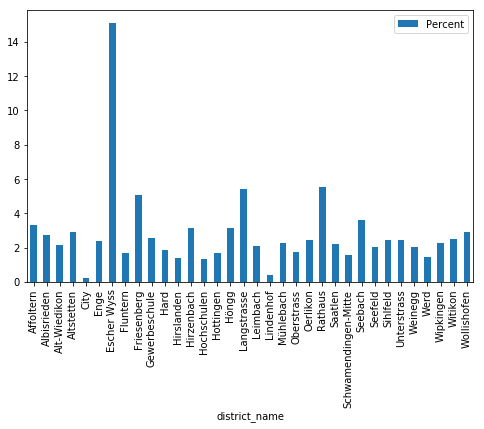

In [92]:
def plot_self_percent_sort(year):
    df=d2same_percent[d2same_percent.Year==year]
    #df=df.sort_values(by=['Percent'])
    df.plot(kind="bar", x='district_name', y='Percent', figsize=(8,5));

plot_self_percent_sort(2009)

We can clearly see that the score of Escher Wyss reaches 15%. In contrast, the next 3 highest scores (Friesenberg, Langstrasse and Rathaus) all stay just below 6%.

#### Plots of popularity for different districts with its own residents over time

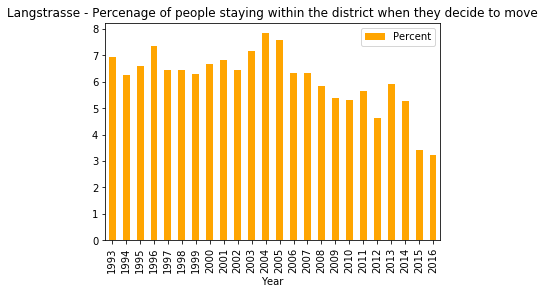

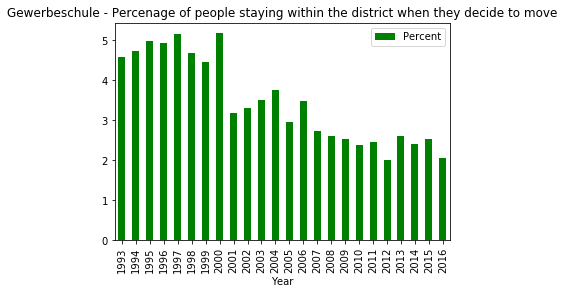

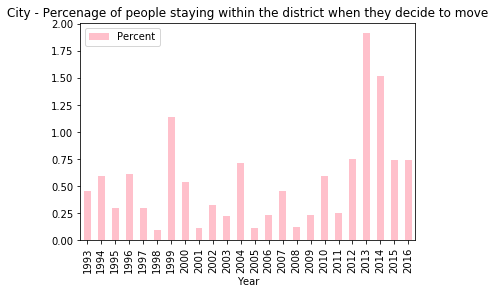

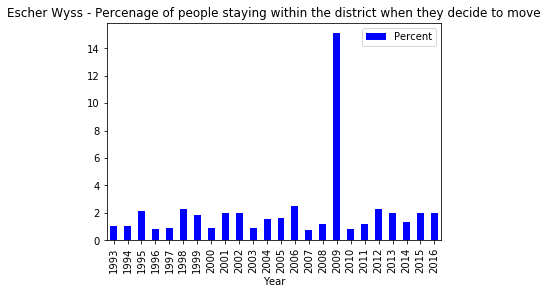

In [93]:
def plot_self_percent_annual(district, colour):
    df=d2same_percent[d2same_percent.district_name==district]
    df.plot(kind="bar", x='Year', y='Percent', figsize=(6,4), color=colour,
           title=district + ' - Percenage of people staying within the district when they decide to move');

plot_self_percent_annual('Langstrasse', 'orange')
plot_self_percent_annual('Gewerbeschule', 'green')
plot_self_percent_annual('City', 'pink')
plot_self_percent_annual('Escher Wyss', 'blue')
# plot_self_percent_annual('Rathaus')

Langstrasse was the most popular district to remain in. We observe that its popularity was above 6.5% until 2007 before gradually declining to around 3%. 

For Gewerbeschule there is a clear shift down in 2001 which remained ever since, and slowly decrease further.

For city we can see that the district is consistently fewed as unsuitable by its residents and very few prefer to leave the district when they move. In 2013 and 2014 it briefly got close to a score of 2% at best.

Escher Wyss was never that popular amongst its residents, with less that 2% deciding to move within the district. However, in 2009 this number shot to 15%. The most likely explanation appears to be that one of the new developments provided better homes and people chose to upgrade, with the effect likely propagating onwards to the homes that were left empty.